In [9]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import eda_helper_functions
from sklearn.ensemble import IsolationForest

## 1.ACCESSING TRAINING DATA FROM DATABASE

In [11]:
from sqlalchemy import create_engine
from sqlalchemy.engine import URL

In [13]:
import psycopg2
hostname = 'localhost'
database = 'nyfd'
user_name = 'postgres'
pwd = 'raksha' 
port_id= 5432
conn=None
cur=None

In [15]:
engine = create_engine(f'postgresql://{user_name}:{pwd}@{hostname}:{port_id}/{database}')

In [17]:
sql = 'SELECT * FROM public.inspection_dc'

In [19]:
insp = pd.read_sql_query(sql,engine)

In [21]:
insp.sample(4)

,facility,address,date_of_inspection,violation_item,violation_description,critical_violation,total_critical_violations,total_crit_not_corrected,total_noncritical_violations,local_health_department,...,permitted_dba,permitted_corp_name,perm_operator_last_name,perm_operator_first_name,nys_health_operation_id,inspection_type,inspection_comments,fs_facility_state,latitude,longitude
1168891,NEW DONG FANG RESTAURANT,"433 MAIN STREET, HIGHLAND FALLS",3/2/2017,8F,Improper thawing procedures used,Not Critical Violation,0.0,0.0,2.0,Orange County,...,None,New Dong Fang Restaurant Inc.,Lam,Peter,845707.0,Inspection,None,NY,41.374900,-73.963440
907001,REYNA VELEZ UTICA,"1315 GENESEE STREET, UTICA",7/13/2007,8A,"Food not protected during storage, preparation...",Not Critical Violation,1.0,0.0,5.0,Oneida County,...,None,None,DE LA CRUZ,REYNA,290241.0,Inspection,None,NY,43.095393,-75.243426
1162809,OASIS RESTAURANT,"153 HARRY L DRIVE, JOHNSON CITY",5/14/2014,8B,In use food dispensing utensils improperly stored,Not Critical Violation,0.0,0.0,4.0,Broome County,...,None,"DAVID'S T-KOASIS, INC.",PLANAVSKY,DAVID,256951.0,Inspection,None,NY,42.122422,-75.953257
696329,Al's Wine & Whiskey Lounge,"321 SOUTH Clinton STREET, Syracuse",4/5/2013,11C,"Food contact surfaces not washed, rinsed and s...",Not Critical Violation,1.0,0.0,3.0,Onondaga County,...,None,"Smokin Whiskey, LLC",Ouderkirk,Dave,556889.0,Inspection,None,NY,43.048030,-76.153180


In [23]:
def copy(df):
    return df

In [25]:
inspec = copy(insp)

In [83]:
inspec.sample(3)

,facility,address,date_of_inspection,violation_item,violation_description,critical_violation,total_critical_violations,total_crit_not_corrected,total_noncritical_violations,local_health_department,...,permitted_dba,permitted_corp_name,perm_operator_last_name,perm_operator_first_name,nys_health_operation_id,inspection_type,inspection_comments,fs_facility_state,latitude,longitude
139477,GOLDEN DRAGON DOBBS FERRY,"17 CEDAR STREET, DOBBS FERRY",1/19/2024,10B,Non-food contact surfaces and equipment are im...,Not Critical Violation,0.0,0.0,5.0,Westchester County,...,None,GOLDEN DRAGON 168 INC,CHEN,QIU RONG,1109301.0,Inspection,All measured hot and cold holding temperatures...,NY,NaN,NaN
1011732,HYDE PARK SNACK BAR,"911 ROBBINS DRIVE, NIAGARA FALLS",9/13/2011,10B,Non-food contact surfaces and equipment are im...,Not Critical Violation,0.0,0.0,4.0,Niagara County,...,None,NIAGARA SPORTS TOURNAMENTS,CARELLA,MICHAEL,285950.0,Inspection,"8D- Single service cups not dispensed, stored...",NY,43.09575,-79.021409
776662,MAPLE LEAF CHILDCARE - MALTA,"2737 ROUTE 9, MALTA",5/22/2023,16,"Miscellaneous, Economic Violation, Choking Pos...",Not Critical Violation,1.0,0.0,4.0,Glens Falls District Office,...,None,"MAPLE LEAF CHILDCARE, INC",ALDRICH,APRIL,828343.0,Inspection,All violations are subject to enforcement acti...,NY,NaN,NaN


## 2.FIXING DATATYPES

In [85]:
inspec.dtypes

facility                         object
address                          object
date_of_inspection               object
violation_item                   object
violation_description            object
critical_violation               object
total_critical_violations       float64
total_crit_not_corrected        float64
total_noncritical_violations    float64
local_health_department          object
county                           object
facility_code                    object
facility_address                 object
facility_city                    object
facility_postal_zipcode          object
nysdoh_gazetteer                float64
facility_municipality            object
operation_name                   object
permit_expiration_date           object
food_service_type                object
food_service_description         object
permitted_dba                    object
permitted_corp_name              object
perm_operator_last_name          object
perm_operator_first_name         object


In [27]:
inspec = inspec.assign(**{
    col:pd.to_datetime(inspec.loc[:,col],dayfirst=True,format="mixed")
    for col in["date_of_inspection","permit_expiration_date"]
})

In [89]:
inspec.dtypes

facility                                object
address                                 object
date_of_inspection              datetime64[ns]
violation_item                          object
violation_description                   object
critical_violation                      object
total_critical_violations              float64
total_crit_not_corrected               float64
total_noncritical_violations           float64
local_health_department                 object
county                                  object
facility_code                           object
facility_address                        object
facility_city                           object
facility_postal_zipcode                 object
nysdoh_gazetteer                       float64
facility_municipality                   object
operation_name                          object
permit_expiration_date          datetime64[ns]
food_service_type                       object
food_service_description                object
permitted_dba

## 3.HIGH LEVEL ANALYSIS OF THE MISSING DATA

In [91]:
inspec.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1310773 entries, 0 to 1310772
Data columns (total 31 columns):
 #   Column                        Non-Null Count    Dtype         
---  ------                        --------------    -----         
 0   facility                      1310734 non-null  object        
 1   address                       1310732 non-null  object        
 2   date_of_inspection            1310734 non-null  datetime64[ns]
 3   violation_item                1069602 non-null  object        
 4   violation_description         1069602 non-null  object        
 5   critical_violation            1310734 non-null  object        
 6   total_critical_violations     1310773 non-null  float64       
 7   total_crit_not_corrected      1310773 non-null  float64       
 8   total_noncritical_violations  1310773 non-null  float64       
 9   local_health_department       1310734 non-null  object        
 10  county                        1310734 non-null  object        
 11

In [93]:
eda_helper_functions.missing_info(inspec)

,count,percentage
variable,,
permitted_dba,1176961,89.791367
inspection_comments,687019,52.413271
longitude,344404,26.274877
latitude,344404,26.274877
perm_operator_first_name,335782,25.617098
perm_operator_last_name,334089,25.487937
permitted_corp_name,305466,23.304264
violation_description,241171,18.399143
violation_item,241171,18.399143


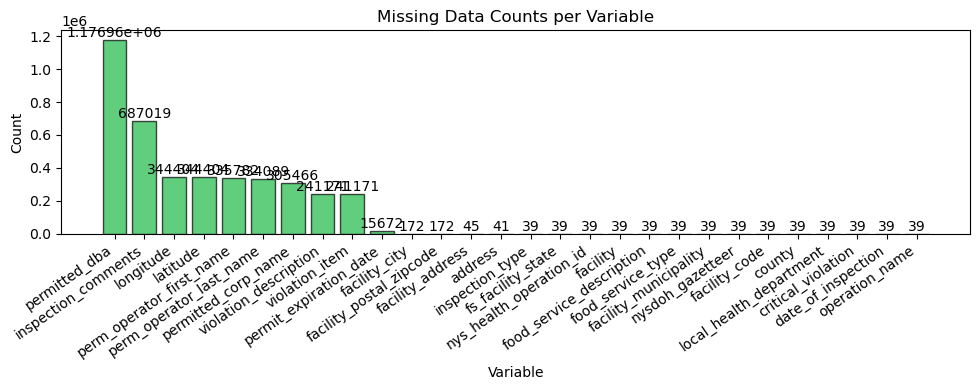

In [95]:
eda_helper_functions.plot_missing_info(inspec)

## 4.PAIR PLOTS

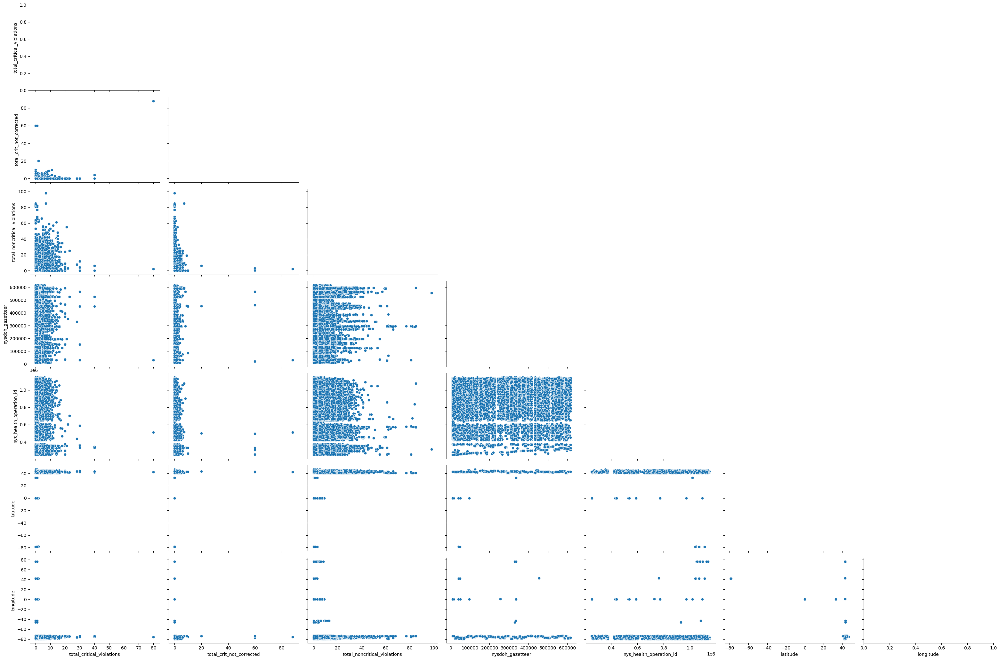

In [97]:
eda_helper_functions.pair_plots(inspec)

- Looking like there is a `correlation` b/w columns `total_critical_violations` and `total_non_critical_violations` 

## 5. CORELATION ANALYSIS

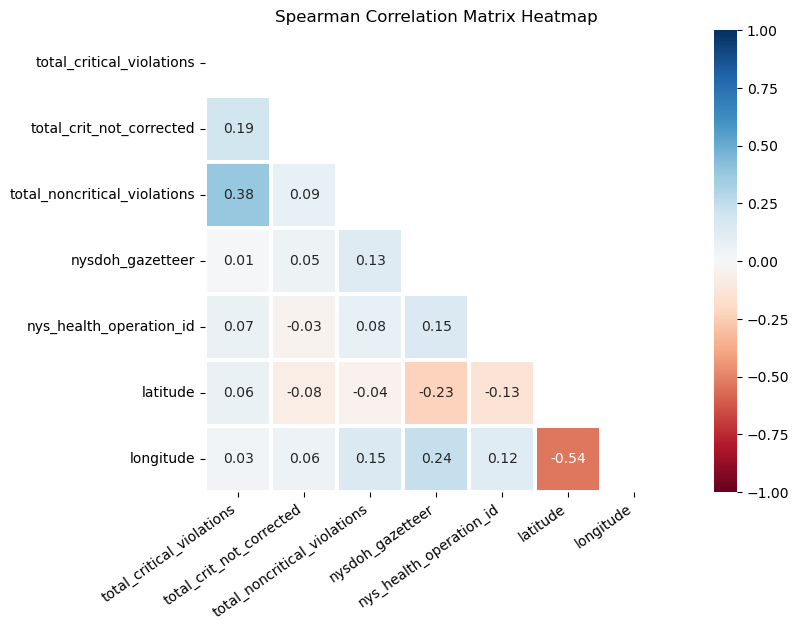

In [208]:
eda_helper_functions.correlation_heatmap(inspec) #corelation analysis for numerical variable

## 6 Imputing Null Values and UNIVARIATE,BIVARIATE ANALYSIS

In [212]:
inspec.columns

Index(['facility', 'address', 'date_of_inspection', 'violation_item',
       'violation_description', 'critical_violation',
       'total_critical_violations', 'total_crit_not_corrected',
       'total_noncritical_violations', 'local_health_department', 'county',
       'facility_code', 'facility_address', 'facility_city',
       'facility_postal_zipcode', 'nysdoh_gazetteer', 'facility_municipality',
       'operation_name', 'permit_expiration_date', 'food_service_type',
       'food_service_description', 'permitted_dba', 'permitted_corp_name',
       'perm_operator_last_name', 'perm_operator_first_name',
       'nys_health_operation_id', 'inspection_type', 'inspection_comments',
       'fs_facility_state', 'latitude', 'longitude'],
      dtype='object')

### 6.1 facility

In [214]:
eda_helper_functions.cat_summary(inspec, "facility")

0                                  WENDYS OF EG
1                 STEUBEN SR DINNER CLUB - BATH
2          MOUNT KISCO COUNTRY CLUB - POOL SNAC
3                MALOUF'S MOUNTAIN SUNSET CAMPS
4                     Pembroke Community Center
                           ...                 
1310868                         PLAZA GARIBALDI
1310869              VanBuren Elementary School
1310870      NEW DIRECTIONS YOUTH & FAMILY SERV
1310871               C.A. of O. & G. Headstart
1310872                               TACO BELL
Name: facility, Length: 1310873, dtype: object

Data Type      : object
Cardinality    : 31971 categories
Missing Data   : 39 rows (0.00 %)
Available Data : 1,310,834 / 1,310,873 rows


,
count,1310834
unique,31971
top,DUNKIN DONUTS
freq,5849


,count,percentage
category,,
DUNKIN DONUTS,5849,4.462045e-03
Dunkin Donuts,2285,1.743165e-03
SUBWAY,1993,1.520406e-03
CHINA GARDEN,1252,9.551171e-04
DUNKIN' DONUTS,1109,8.460263e-04
CHINA WOK,1075,8.200886e-04
MCDONALD'S,1041,7.941509e-04
Darien Lake FSE,989,7.544815e-04
APPLEBEE'S NEIGHBORHOOD GRILL & BAR,981,7.483785e-04


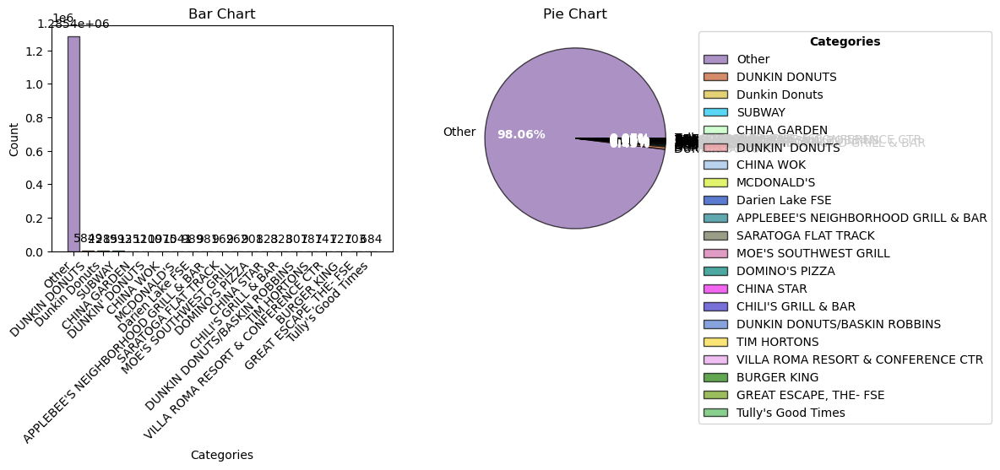

In [220]:
eda_helper_functions.cat_univar_plots(inspec, "facility", show_wordcloud=False, k=20)

In [222]:
eda_helper_functions.hyp_cat_cat(inspec,"facility","critical_violation")

- Cramers V            : 0.19430579860122243
- Significance Level   : 5.0%
- Null Hypothesis      : The samples are uncorrelated
- Alternate Hypothesis : The samples are correlated
- Test Statistic       : 81460.18790504719
- p-value              : 0.0
- Since p-value is less than 0.05, we Reject the Null Hypothesis at 5.0% significance level
- CONCLUSION: The variables facility and critical_violation are correlated


- There are too many `restuarants or facilites` which is making us difficult to visualize.
- There is `association factor` leading the correaltion b/w `facility` and `critical_violation` like `facility type` which we can see in `Feature Engg.`

-  Drop missing names of `facility`

In [262]:
inspec['facility'].isna().sum()

39

In [264]:
#Imputing null values of facility as'Unknown'
inspec['facility'] = inspec['facility'].fillna('UnKnown')

In [266]:
inspec['facility'].isna().sum()

0

In [148]:
fac = []
for name in inspec.facility.unique():
    fac.append(name)
    


In [156]:
import json

with open('fac.json', 'w') as f:
    json.dump(fac, f)

### 6.2 Date of inspection


In [227]:
eda_helper_functions.cat_summary(inspec, "date_of_inspection")

0         2022-06-30
1         2020-07-11
2         2011-04-20
3         2012-08-13
4         2022-11-30
             ...    
1310868          NaT
1310869          NaT
1310870          NaT
1310871          NaT
1310872          NaT
Name: date_of_inspection, Length: 1310873, dtype: datetime64[ns]

Data Type      : datetime64[ns]
Cardinality    : 9054 categories
Missing Data   : 472,005 rows (36.01 %)
Available Data : 838,868 / 1,310,873 rows


,
count,838868
mean,2016-07-26 15:53:14.985623808
min,1900-01-01 00:00:00
25%,2012-08-28 00:00:00
50%,2017-06-09 00:00:00
75%,2021-09-11 00:00:00
max,2024-12-06 00:00:00


,count,percentage
category,,
2023-11-15,607,0.000724
2023-03-23,540,0.000644
2023-11-30,537,0.000640
2024-01-31,537,0.000640
2023-12-13,523,0.000623
2023-11-16,511,0.000609
2024-01-02,508,0.000606
2023-11-14,505,0.000602
2023-02-03,502,0.000598


In [128]:
inspec['year'] = inspec.date_of_inspection.dt.year

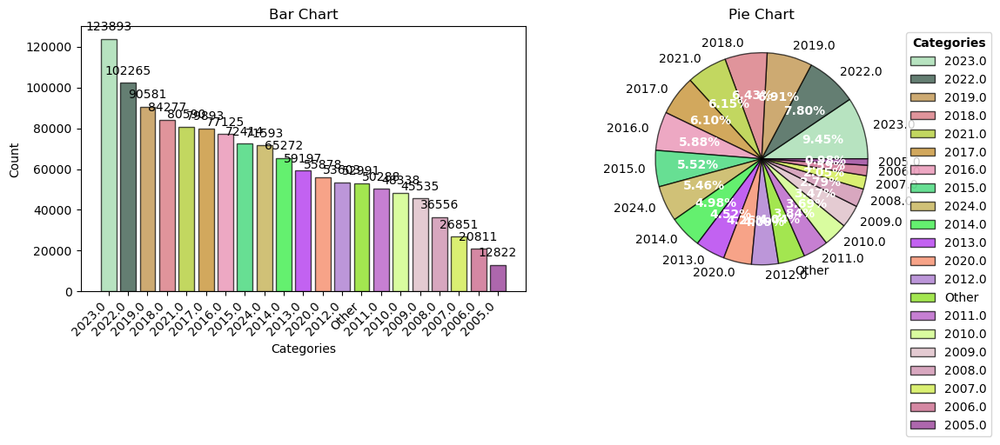

In [130]:
eda_helper_functions.cat_univar_plots(inspec, "year", show_wordcloud=False,k=20)

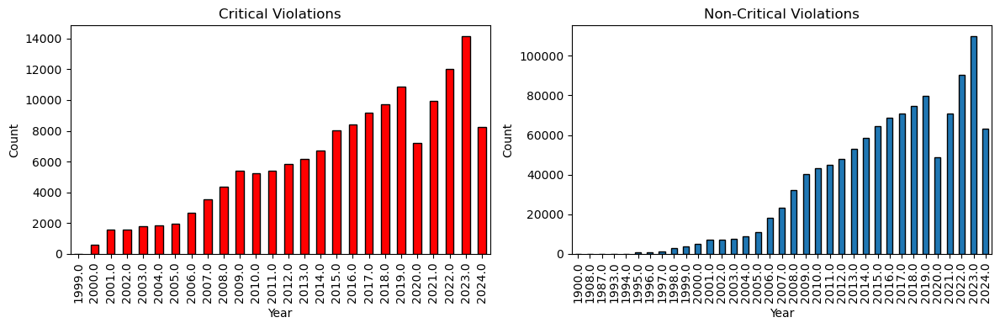

In [132]:
fig, axs = plt.subplots(1, 2, figsize=(12, 4))

(
    inspec
    .assign(year=inspec['date_of_inspection'].dt.year)
    .query('critical_violation == "Critical Violation"')
    .groupby('year')
    .size()
    .plot(
        kind="bar",
        ax=axs[0],
        color="#FF0000",
        edgecolor="black"

    )
)
axs[0].set_title('Critical Violations')
axs[0].set_xlabel('Year')
axs[0].set_ylabel('Count')

(
    inspec
    .assign(year=inspec['date_of_inspection'].dt.year)
    .query('critical_violation == "Not Critical Violation"')
    .groupby('year')
    .size()
    .plot(
        kind="bar",
        ax=axs[1],
        edgecolor="black"
    )
)
axs[1].set_title('Non-Critical Violations')
axs[1].set_xlabel('Year')
axs[1].set_ylabel('Count')

plt.tight_layout()
plt.show()

In [134]:
eda_helper_functions.hyp_cat_cat(inspec,"year","critical_violation")

- Cramers V            : 0.050714633451762345
- Significance Level   : 5.0%
- Null Hypothesis      : The samples are uncorrelated
- Alternate Hypothesis : The samples are correlated
- Test Statistic       : 3405.17128336561
- p-value              : 0.0
- Since p-value is less than 0.05, we Reject the Null Hypothesis at 5.0% significance level
- CONCLUSION: The variables year and critical_violation are correlated


In [136]:
inspec['month'] = inspec.date_of_inspection.dt.month

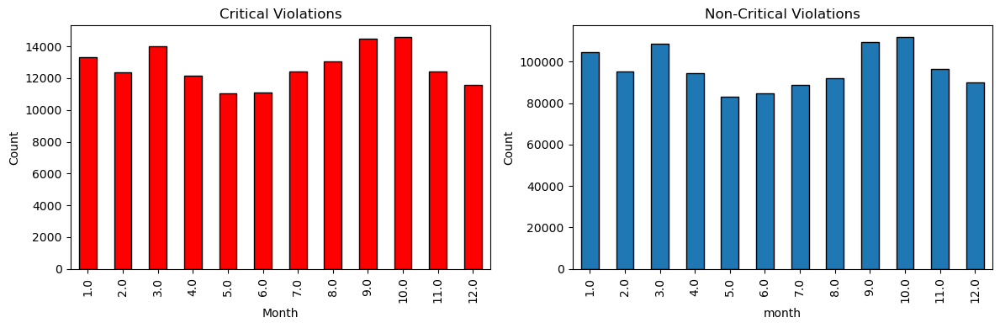

In [138]:
fig, axs = plt.subplots(1, 2, figsize=(12, 4))

(
    inspec
    .assign(month=inspec['date_of_inspection'].dt.month)
    .query('critical_violation == "Critical Violation"')
    .groupby('month')
    .size()
    .plot(
        kind="bar",
        ax=axs[0],
        color="#FF0000",
        edgecolor="black"

    )
)
axs[0].set_title('Critical Violations')
axs[0].set_xlabel('Month')
axs[0].set_ylabel('Count')

(
    inspec
    .assign(month=inspec['date_of_inspection'].dt.month)
    .query('critical_violation == "Not Critical Violation"')
    .groupby('month')
    .size()
    .plot(
        kind="bar",
        ax=axs[1],
        edgecolor="black"
    )
)
axs[1].set_title('Non-Critical Violations')
axs[1].set_xlabel('month')
axs[1].set_ylabel('Count')

plt.tight_layout()
plt.show()

In [140]:
eda_helper_functions.hyp_cat_cat(inspec,"month","critical_violation")

- Cramers V            : 0.010372036095778595
- Significance Level   : 5.0%
- Null Hypothesis      : The samples are uncorrelated
- Alternate Hypothesis : The samples are correlated
- Test Statistic       : 152.00752782798628
- p-value              : 5.794565740447629e-27
- Since p-value is less than 0.05, we Reject the Null Hypothesis at 5.0% significance level
- CONCLUSION: The variables month and critical_violation are correlated


In [142]:
inspec['day'] = inspec.date_of_inspection.dt.day

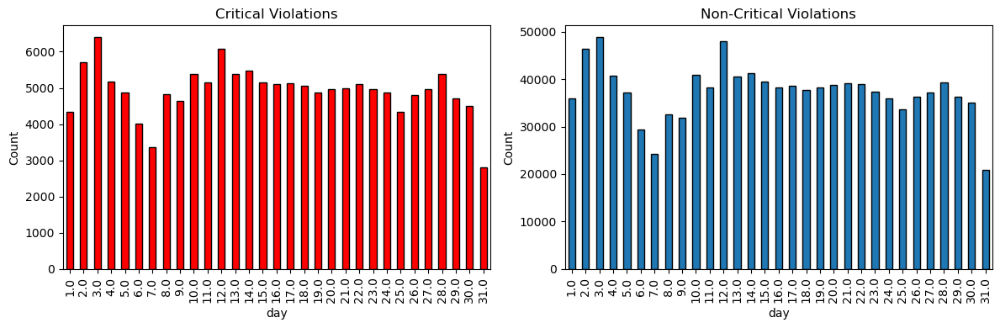

In [144]:
fig, axs = plt.subplots(1, 2, figsize=(12, 4))

(
    inspec
    .assign(month=inspec['date_of_inspection'].dt.day)
    .query('critical_violation == "Critical Violation"')
    .groupby('day')
    .size()
    .plot(
        kind="bar",
        ax=axs[0],
        color="#FF0000",
        edgecolor="black"

    )
)
axs[0].set_title('Critical Violations')
axs[0].set_xlabel('day')
axs[0].set_ylabel('Count')

(
    inspec
    .assign(month=inspec['date_of_inspection'].dt.day)
    .query('critical_violation == "Not Critical Violation"')
    .groupby('month')
    .size()
    .plot(
        kind="bar",
        ax=axs[1],
        edgecolor="black"
    )
)
axs[1].set_title('Non-Critical Violations')
axs[1].set_xlabel('day')
axs[1].set_ylabel('Count')

plt.tight_layout()
plt.show()

In [146]:
eda_helper_functions.hyp_cat_cat(inspec,"day","critical_violation")

- Cramers V            : 0.011888675282362943
- Significance Level   : 5.0%
- Null Hypothesis      : The samples are uncorrelated
- Alternate Hypothesis : The samples are correlated
- Test Statistic       : 215.25981150762897
- p-value              : 6.659178518257891e-30
- Since p-value is less than 0.05, we Reject the Null Hypothesis at 5.0% significance level
- CONCLUSION: The variables day and critical_violation are correlated


- From the hyp test we got to know that `day`,`month`,`year` are `Not correlated with `critical_violation`.

In [192]:
#Imputing null values for year,month,day
print(inspec.year.isna().sum(),inspec.month.isna().sum(),inspec.day.isna().sum())


0 0 0


* Using `MICE` ALGORITHM TO IMPUTE VALUES [`REGRESSION TECHNIQUE TO IMPUTE VALUES`]

In [174]:
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

In [176]:
imputer = IterativeImputer(random_state = 42)

In [178]:
cols =['year','month',
       'day']
inspec[cols] = imputer.fit_transform(inspec[cols])

In [180]:
print(inspec.year.isna().sum(),inspec.month.isna().sum(),inspec.day.isna().sum())


0 0 0


In [182]:
inspec['date_of_inspection_transformed'] = pd.to_datetime(inspec[['year', 'month', 'day']], format='mixed', dayfirst=True, errors='coerce')

In [184]:
inspec.date_of_inspection_transformed

0         2009-04-02
1         2002-06-27
2         2006-08-24
3         2016-07-09
4         2018-12-02
             ...    
1310768   2007-04-04
1310769   2009-10-29
1310770   2014-01-30
1310771   2017-09-05
1310772   2021-10-25
Name: date_of_inspection_transformed, Length: 1310773, dtype: datetime64[ns]

In [196]:
inspec.date_of_inspection_transformed.isna().sum()

39

In [202]:
#removing those 39 dates causing issues
inspec = inspec.dropna(subset=['date_of_inspection_transformed'])

In [204]:
inspec.date_of_inspection_transformed.isna().sum()

0

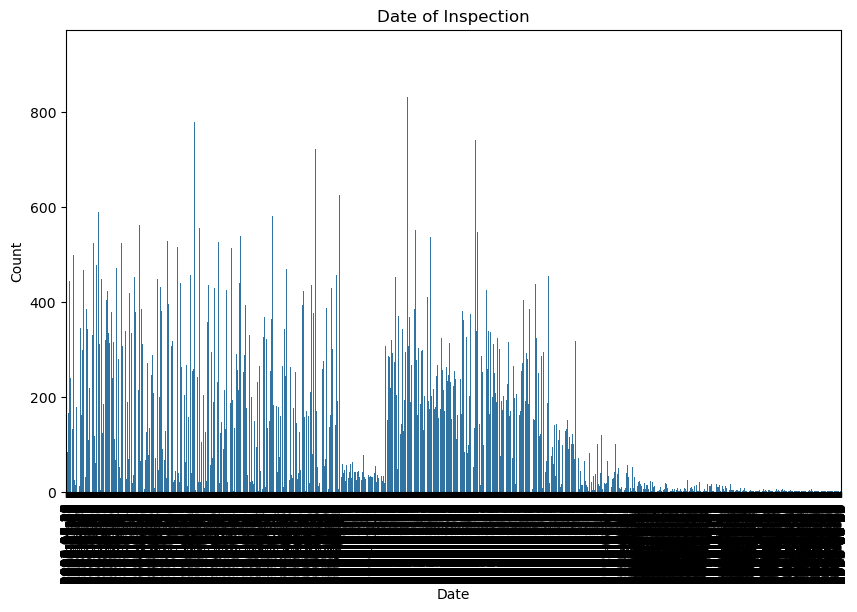

In [31]:
import matplotlib.pyplot as plt
import seaborn as sns
# Plot the date column
plt.figure(figsize=(10,6))
sns.countplot(x='date_of_inspection', data=inspec)
plt.title('Date of Inspection')
plt.xlabel('Date')
plt.ylabel('Count')
plt.xticks(rotation=90)
plt.show()

In [37]:
inspec.groupby('date_of_inspection')['violation_item'].value_counts()

date_of_inspection  violation_item
2001-02-28          14A               1
2001-03-08          10A               1
                    10B               1
                    15A               1
                    15B               1
                                     ..
2024-12-06          1D                1
                    2C                1
                    4A                1
                    7A                1
                    9A                1
Name: count, Length: 174329, dtype: int64

In [43]:
inspec.groupby('facility')['date_of_inspection'].value_counts() 

facility                          date_of_inspection
#1 King's Buffet, A               2006-06-03            15
                                  2018-03-21            13
                                  2008-11-04            12
                                  2019-06-03            12
                                  2009-09-03            11
                                                        ..
iPHO                              2024-02-04             1
                                  2024-10-05             1
the COUNTRY PUNKIN' BAKERY, LLC.  2022-10-03             3
                                  2023-02-21             1
                                  2024-02-16             1
Name: count, Length: 530605, dtype: int64

In [71]:
inspec[(inspec['facility'] == "#1 King's Buffet, A") & (inspec['date_of_inspection']== '2006-06-03')]

,facility,address,date_of_inspection,violation_item,violation_description,critical_violation,total_critical_violations,total_crit_not_corrected,total_noncritical_violations,local_health_department,...,permitted_dba,permitted_corp_name,perm_operator_last_name,perm_operator_first_name,nys_health_operation_id,inspection_type,inspection_comments,fs_facility_state,latitude,longitude
141686,"#1 King's Buffet, A","115 Harte Haven Plaza, Massena",2006-06-03,8D,"Single service items reused, improperly stored...",Not Critical Violation,2.0,0.0,26.0,Canton District Office,...,None,"A # 1 King's Buffet, Inc.",Guan,Yuanlin,325026.0,Inspection,None,NY,44.91981,-74.880849
141899,"#1 King's Buffet, A","115 Harte Haven Plaza, Massena",2006-06-03,12D,"Toilet facilities inadequate, inconvenient, di...",Not Critical Violation,2.0,0.0,26.0,Canton District Office,...,None,"A # 1 King's Buffet, Inc.",Guan,Yuanlin,325026.0,Inspection,None,NY,44.91981,-74.880849
307142,"#1 King's Buffet, A","115 Harte Haven Plaza, Massena",2006-06-03,11B,"Wiping cloths dirty, not stored properly in sa...",Not Critical Violation,2.0,0.0,26.0,Canton District Office,...,None,"A # 1 King's Buffet, Inc.",Guan,Yuanlin,325026.0,Inspection,None,NY,44.91981,-74.880849
470817,"#1 King's Buffet, A","115 Harte Haven Plaza, Massena",2006-06-03,8A,"Food not protected during storage, preparation...",Not Critical Violation,2.0,0.0,26.0,Canton District Office,...,None,"A # 1 King's Buffet, Inc.",Guan,Yuanlin,325026.0,Inspection,None,NY,44.91981,-74.880849
471304,"#1 King's Buffet, A","115 Harte Haven Plaza, Massena",2006-06-03,12E,"Handwashing facilities inaccessible, improperl...",Not Critical Violation,2.0,0.0,26.0,Canton District Office,...,None,"A # 1 King's Buffet, Inc.",Guan,Yuanlin,325026.0,Inspection,None,NY,44.91981,-74.880849
472000,"#1 King's Buffet, A","115 Harte Haven Plaza, Massena",2006-06-03,8B,In use food dispensing utensils improperly stored,Not Critical Violation,2.0,0.0,26.0,Canton District Office,...,None,"A # 1 King's Buffet, Inc.",Guan,Yuanlin,325026.0,Inspection,None,NY,44.91981,-74.880849
755248,"#1 King's Buffet, A","115 Harte Haven Plaza, Massena",2006-06-03,5A,Potentially hazardous foods are not kept at or...,Critical Violation,2.0,0.0,26.0,Canton District Office,...,None,"A # 1 King's Buffet, Inc.",Guan,Yuanlin,325026.0,Inspection,None,NY,44.91981,-74.880849
758402,"#1 King's Buffet, A","115 Harte Haven Plaza, Massena",2006-06-03,15A,"Floors, walls, ceilings, not smooth, properly ...",Not Critical Violation,2.0,0.0,26.0,Canton District Office,...,None,"A # 1 King's Buffet, Inc.",Guan,Yuanlin,325026.0,Inspection,None,NY,44.91981,-74.880849
787364,"#1 King's Buffet, A","115 Harte Haven Plaza, Massena",2006-06-03,15B,"Lighting and ventilation inadequate, fixtures ...",Not Critical Violation,2.0,0.0,26.0,Canton District Office,...,None,"A # 1 King's Buffet, Inc.",Guan,Yuanlin,325026.0,Inspection,None,NY,44.91981,-74.880849
848490,"#1 King's Buffet, A","115 Harte Haven Plaza, Massena",2006-06-03,10A,Food (ice) contact surfaces are improperly des...,Not Critical Violation,2.0,0.0,26.0,Canton District Office,...,None,"A # 1 King's Buffet, Inc.",Guan,Yuanlin,325026.0,Inspection,None,NY,44.91981,-74.880849


### 6.3 violation item

In [250]:
eda_helper_functions.cat_summary(inspec, "violation_item")

0          None
1          None
2          None
3          None
4          None
           ... 
1310868    None
1310869    None
1310870    None
1310871    None
1310872    None
Name: violation_item, Length: 1310873, dtype: object

Data Type      : object
Cardinality    : 98 categories
Missing Data   : 241,221 rows (18.40 %)
Available Data : 1,069,652 / 1,310,873 rows


,
count,1069652
unique,98
top,15A
freq,110164


,count,percentage
category,,
15A,110164,1.029905e-01
8A,98253,9.185511e-02
10B,78069,7.298542e-02
11D,77756,7.269280e-02
15B,68602,6.413488e-02
12E,54439,5.089412e-02
8E,40531,3.789176e-02
12C,39988,3.738412e-02
11C,35513,3.320052e-02


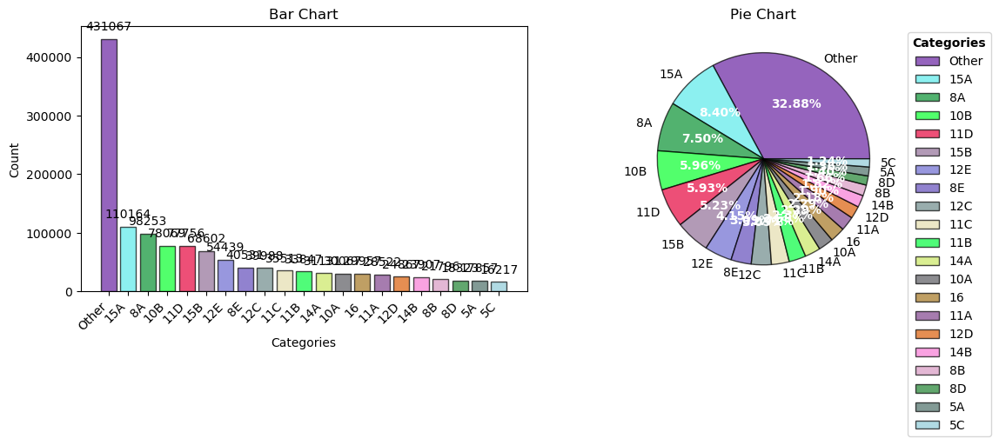

In [254]:
eda_helper_functions.cat_univar_plots(inspec, "violation_item", show_wordcloud=False, k=20)

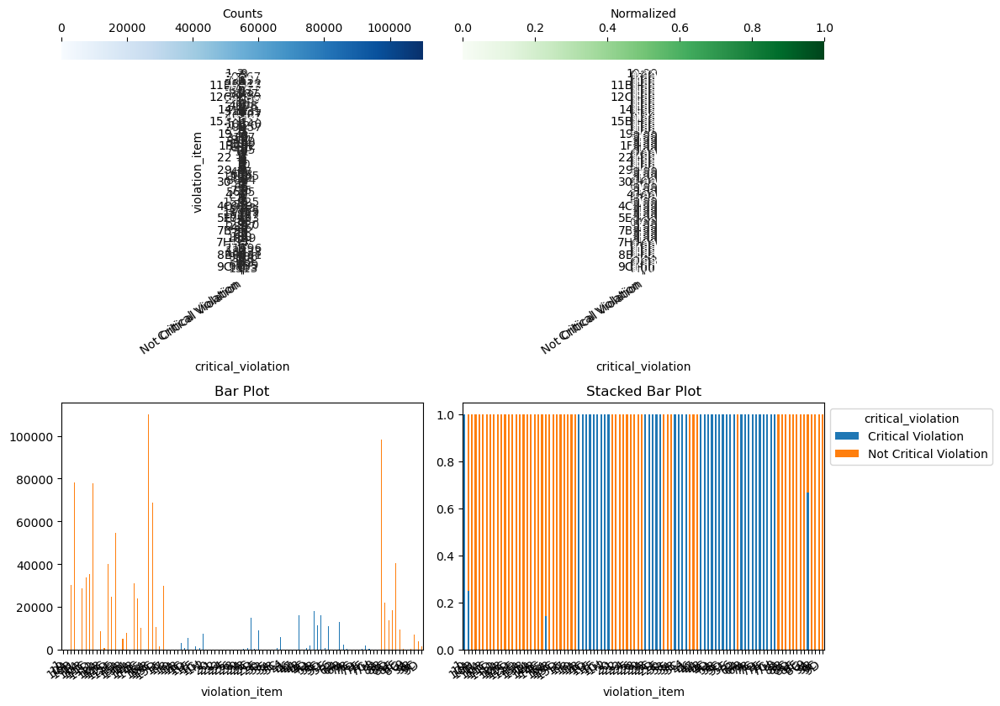

In [256]:
eda_helper_functions.cat_bivar_plots(inspec,"violation_item","critical_violation")

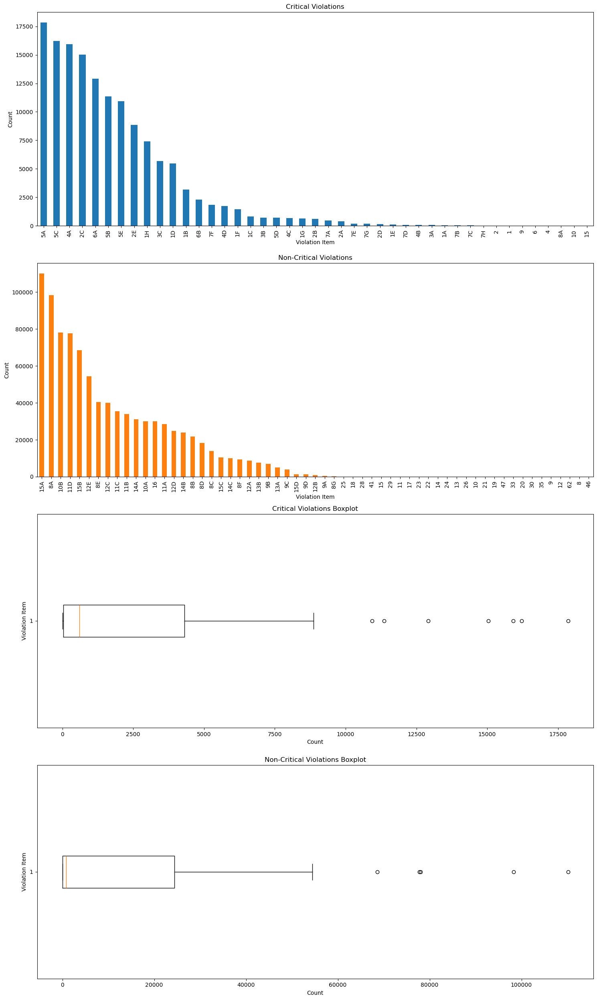

In [320]:
critical = inspec[inspec['critical_violation'] == 'Critical Violation']
non_critical = inspec[inspec['critical_violation'] == 'Not Critical Violation']

critical_counts = critical['violation_item'].value_counts()
non_critical_counts = non_critical['violation_item'].value_counts()

fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, figsize=(15, 25))

# Bar plots
critical_counts.plot(kind='bar', ax=ax1, color='#1f77b4')
ax1.set_title('Critical Violations')
ax1.set_xlabel('Violation Item')
ax1.set_ylabel('Count')
ax1.tick_params(axis='x', rotation=90)

non_critical_counts.plot(kind='bar', ax=ax2, color='#ff7f0e')
ax2.set_title('Non-Critical Violations')
ax2.set_xlabel('Violation Item')
ax2.set_ylabel('Count')
ax2.tick_params(axis='x', rotation=90)
# Box plots
# Box plots
ax3.boxplot(critical['violation_item'].value_counts().values, vert=False)
ax3.set_title('Critical Violations Boxplot')
ax3.set_xlabel('Count')
ax3.set_ylabel('Violation Item')

ax4.boxplot(non_critical['violation_item'].value_counts().values, vert=False)
ax4.set_title('Non-Critical Violations Boxplot')
ax4.set_xlabel('Count')
ax4.set_ylabel('Violation Item')

plt.tight_layout()
plt.show()

In [260]:
eda_helper_functions.hyp_cat_cat(inspec,"violation_item","critical_violation")

- Cramers V            : 0.9999419967775636
- Significance Level   : 5.0%
- Null Hypothesis      : The samples are uncorrelated
- Alternate Hypothesis : The samples are correlated
- Test Statistic       : 1069623.9172786903
- p-value              : 0.0
- Since p-value is less than 0.05, we Reject the Null Hypothesis at 5.0% significance level
- CONCLUSION: The variables violation_item and critical_violation are correlated


- From `chi-square test` where p values is less than 0.05, we can conclude there is association.
- From `crammers V` we got 0.9999, which is `strong assocition or relation` b/w `violation item` and `critical violation`.
  

In [331]:
(
    inspec.
    violation_item.
    isna().sum()
)

241221

- `Labeling` missing values as `Nan`

In [234]:
#Imputing null values of facility as'Nan'
inspec['violation_item'] = inspec['violation_item'].fillna('Nan')

In [236]:
inspec['violation_item'].isna().sum()

0

### 6.4 Total critical violations

In [357]:
eda_helper_functions.num_summary(inspec, "total_critical_violations")

0          0.0
1          NaN
2          NaN
3          0.0
4          0.0
          ... 
1310868    NaN
1310869    0.0
1310870    0.0
1310871    0.0
1310872    0.0
Name: total_critical_violations, Length: 1310873, dtype: float64

Data Type      : float64
Missing Data   : 80,801 rows (6.16 %)
Available Data : 1,230,072 / 1,310,873 rows


,value
percentile,
0,0.0
5,0.0
10,0.0
25,0.0
50,0.0
75,1.0
90,2.0
95,3.0
99,6.0


,value
mean,0.812794
trimmed mean (5%),NaN
trimmed mean (10%),0.678499
median,0.000000


,value
var,2.062710
std,1.436214
IQR,1.000000
mad,0.000000
coef_variance,1.767009


,value
skewness,3.574699
kurtosis,35.448043


Significance Level   : 0.05
Null Hypothesis      : The data is normally distributed
Alternate Hypothesis : The data is not normally distributed
p-value              : 1.115904083929538e-204
Test Statistic       : 0.6099316408540765
- Since p-value is less than alpha (0.05), we Reject the Null Hypothesis at 5.0% significance level
- CONCLUSION: We conclude that the data sample is not normally distributed


Significance Level   : 0.05
Null Hypothesis      : The data is normally distributed
Alternate Hypothesis : The data is not normally distributed
Critical Value       : 0.787
Test Statistic       : 154095.70117472112
- Since the Test-statistic is greater than Critical Value, we Reject the Null Hypothesis at 5.0% significance level
- CONCLUSION: We conclude that the data sample is not normally distributed


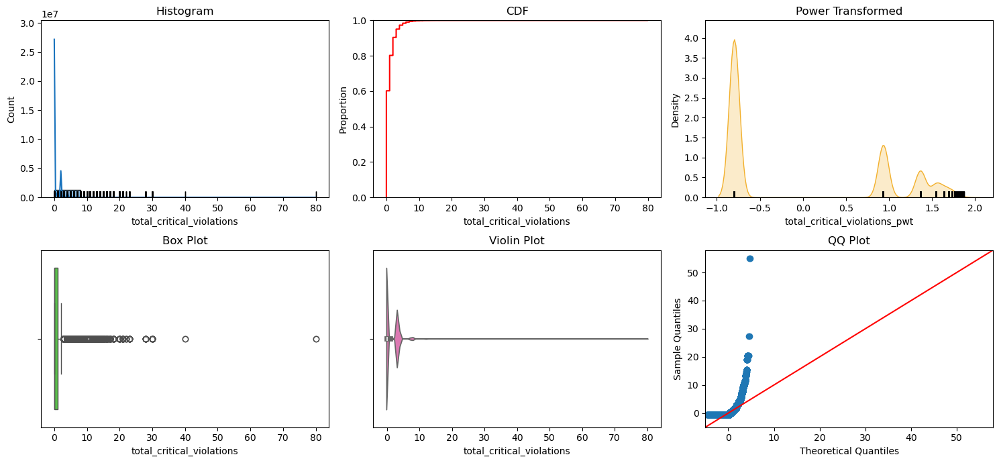

In [359]:
eda_helper_functions.num_univar_plots(inspec, "total_critical_violations")

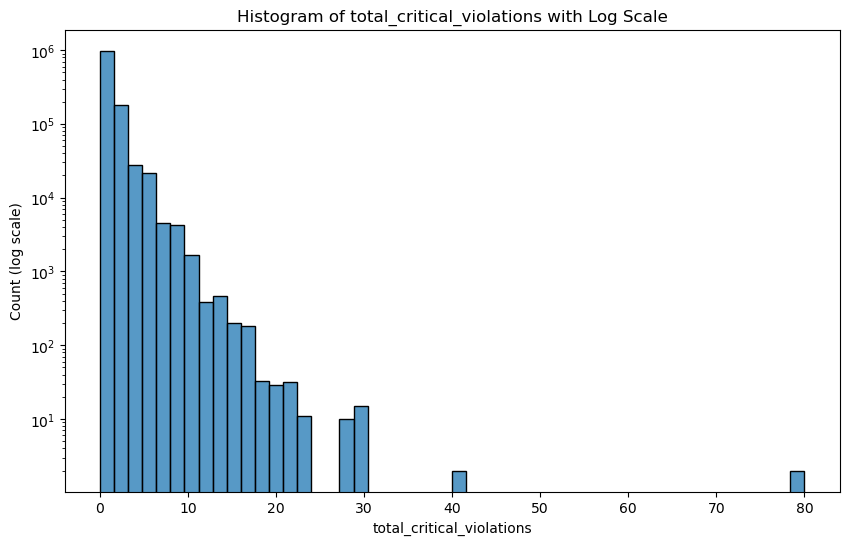

In [373]:
plt.figure(figsize=(10, 6))
sns.histplot(data=inspec, x="total_critical_violations", bins=50)
plt.yscale('log')
plt.xlabel('total_critical_violations')
plt.ylabel('Count (log scale)')
plt.title('Histogram of total_critical_violations with Log Scale')
plt.show()

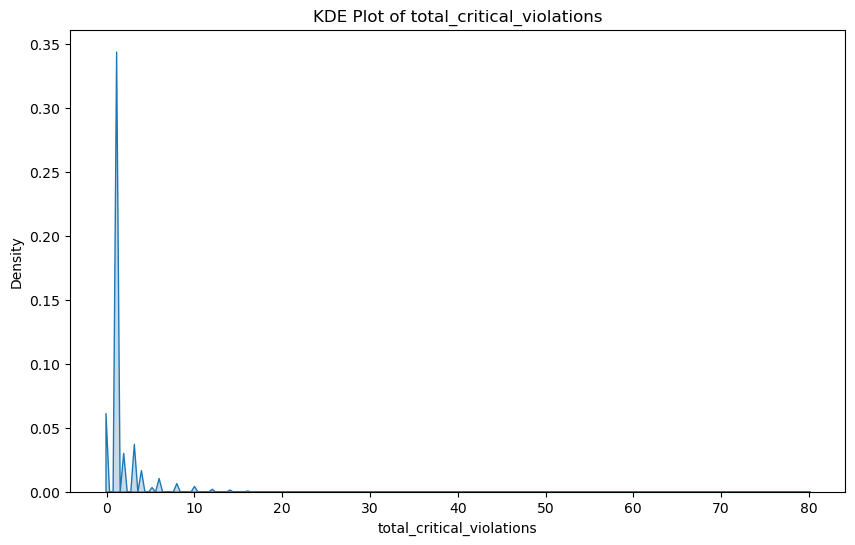

Skewness of total_critical_violations: 3.5746946897630463


In [398]:
from scipy.stats import skew
plt.figure(figsize=(10, 6))
sns.kdeplot(data=inspec, x="total_critical_violations", fill=True, bw_adjust=0.5)
plt.xlabel('total_critical_violations')
plt.ylabel('Density')
plt.title('KDE Plot of total_critical_violations')
plt.show()

# Skewness Calculation
skewness_value = skew(inspec['total_critical_violations'].dropna())
print(f'Skewness of total_critical_violations: {skewness_value}')

- From the plots we can realize that data(`total_critical_violations`) is right skewed and `power transform` is required to improve the distribution of the data.

In [382]:
#Power transform

In [384]:
from sklearn.preprocessing import power_transform
transformed_data = power_transform(inspec[['total_critical_violations']])
transformed_series = pd.Series(transformed_data.flatten(), name='total_critical_violations_transformed')
inspec['total_critical_violations_transformed'] = transformed_series

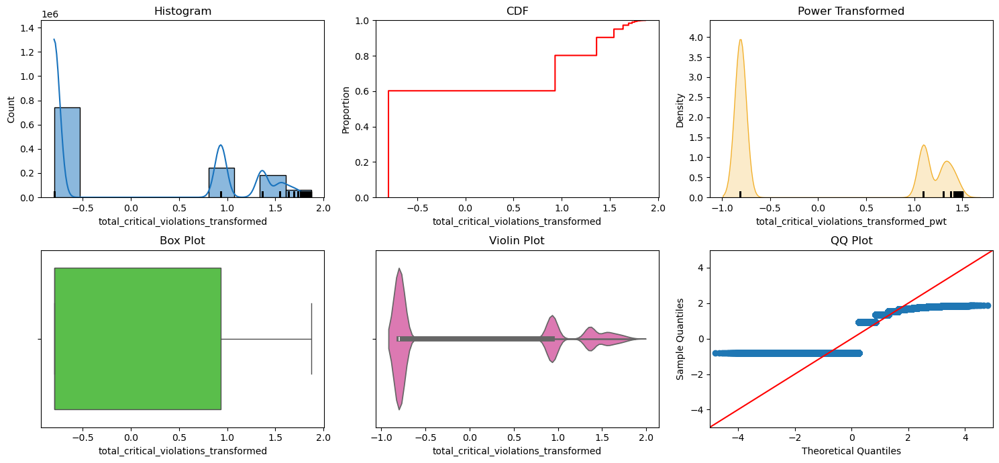

In [386]:
eda_helper_functions.num_univar_plots(inspec, "total_critical_violations_transformed")

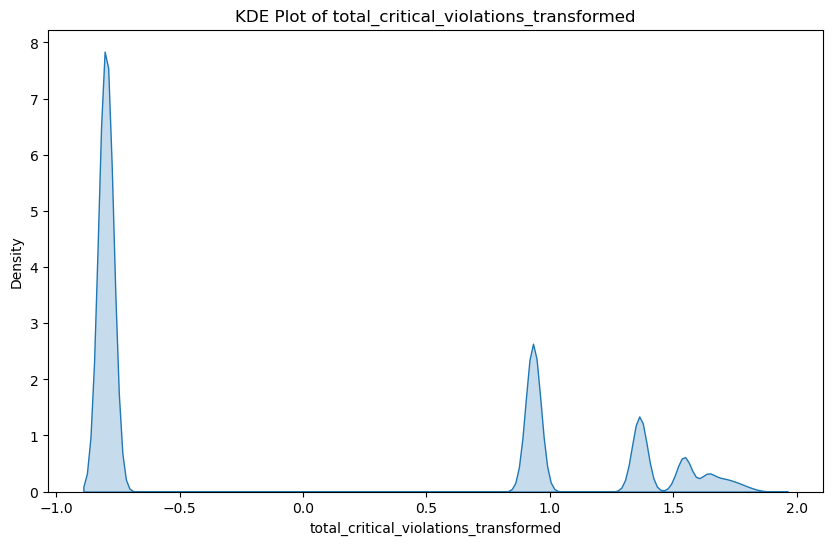

Skewness of total_critical_violations: 3.5746946897630463


In [400]:
plt.figure(figsize=(10, 6))
sns.kdeplot(data=inspec, x="total_critical_violations_transformed", fill=True, bw_adjust=0.5)
plt.xlabel('total_critical_violations_transformed')
plt.ylabel('Density')
plt.title('KDE Plot of total_critical_violations_transformed')
plt.show()

# Skewness Calculation
skewness_value = skew(inspec['total_critical_violations'].dropna())
print(f'Skewness of total_critical_violations: {skewness_value}')

In [418]:
eda_helper_functions.num_summary(inspec, "total_critical_violations_transformed")

0         -0.798815
1               NaN
2               NaN
3         -0.798815
4         -0.798815
             ...   
1310868         NaN
1310869   -0.798815
1310870   -0.798815
1310871   -0.798815
1310872   -0.798815
Name: total_critical_violations_transformed, Length: 1310873, dtype: float64

Data Type      : float64
Missing Data   : 80,801 rows (6.16 %)
Available Data : 1,230,072 / 1,310,873 rows


,value
percentile,
0,-0.798815
5,-0.798815
10,-0.798815
25,-0.798815
50,-0.798815
75,0.931789
90,1.362713
95,1.543037
99,1.732757


,value
mean,1.506262e-16
trimmed mean (5%),NaN
trimmed mean (10%),1.820141e-02
median,-7.988153e-01


,value
var,1.000001e+00
std,1.000000e+00
IQR,1.730604e+00
mad,0.000000e+00
coef_variance,6.638952e+15


,value
skewness,0.524874
kurtosis,-1.579566


Significance Level   : 0.05
Null Hypothesis      : The data is normally distributed
Alternate Hypothesis : The data is not normally distributed
p-value              : 2.5500062520168154e-195
Test Statistic       : 0.6966439834920961
- Since p-value is less than alpha (0.05), we Reject the Null Hypothesis at 5.0% significance level
- CONCLUSION: We conclude that the data sample is not normally distributed


Significance Level   : 0.05
Null Hypothesis      : The data is normally distributed
Alternate Hypothesis : The data is not normally distributed
Critical Value       : 0.787
Test Statistic       : 183917.40284840693
- Since the Test-statistic is greater than Critical Value, we Reject the Null Hypothesis at 5.0% significance level
- CONCLUSION: We conclude that the data sample is not normally distributed


- Even after `power transformation`,Normality `doesnt satisfied`.
- But significant improvment in ` removing outliers`

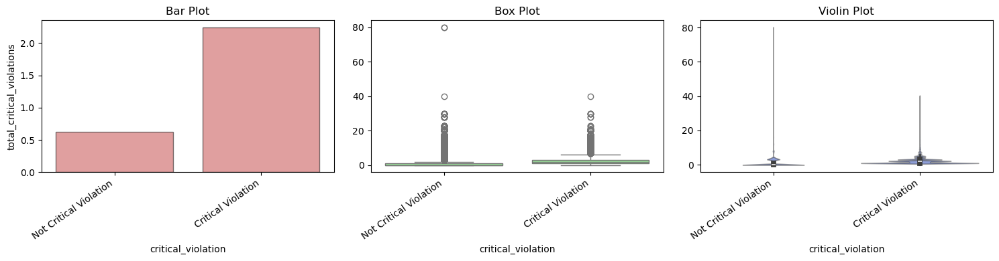

In [443]:
eda_helper_functions.num_cat_bivar_plots(
	data=inspec,
	num_var="total_critical_violations",
	cat_var="critical_violation"
)

In [440]:
eda_helper_functions.num_cat_hyp_testing(inspec, "total_critical_violations", "critical_violation")

- Significance Level   : 5.0%
- Null Hypothesis      : The groups have similar population mean
- Alternate Hypothesis : The groups don't have similar population mean
- Test Statistic       : 186165.17513143457
- p-value              : 0.0
- Since p-value is less than 0.05, we Reject the Null Hypothesis at 5.0% significance level
- CONCLUSION: The variables total_critical_violations and critical_violation are associated to each other


- Significance Level   : 5.0%
- Null Hypothesis      : The groups have similar population median
- Alternate Hypothesis : The groups don't have similar population median
- Test Statistic       : 255319.94322677233
- p-value              : 0.0
- Since p-value is less than 0.05, we Reject the Null Hypothesis at 5.0% significance level
- CONCLUSION: The variables total_critical_violations and critical_violation are associated to each other


- `Total_critical_violations` and `critical_violation` are correlated associated with each other.

### 6.5 Total critical violations not corrected 

In [35]:
eda_helper_functions.num_summary(inspec, "total_crit_not_corrected")

0          0.0
1          NaN
2          NaN
3          0.0
4          0.0
          ... 
1310868    NaN
1310869    0.0
1310870    0.0
1310871    0.0
1310872    0.0
Name: total_crit_not_corrected, Length: 1310873, dtype: float64

Data Type      : float64
Missing Data   : 81,419 rows (6.21 %)
Available Data : 1,229,454 / 1,310,873 rows


,value
percentile,
0,0.0
5,0.0
10,0.0
25,0.0
50,0.0
75,0.0
90,0.0
95,0.0
99,1.0


,value
mean,0.028761
trimmed mean (5%),NaN
trimmed mean (10%),0.000000
median,0.000000


,value
var,0.086865
std,0.294729
IQR,0.000000
mad,0.000000
coef_variance,10.247635


,value
skewness,98.793881
kurtosis,22875.088697


Significance Level   : 0.05
Null Hypothesis      : The data is normally distributed
Alternate Hypothesis : The data is not normally distributed
p-value              : 6.415467656068668e-239
Test Statistic       : 0.065399101732034
- Since p-value is less than alpha (0.05), we Reject the Null Hypothesis at 5.0% significance level
- CONCLUSION: We conclude that the data sample is not normally distributed


Significance Level   : 0.05
Null Hypothesis      : The data is normally distributed
Alternate Hypothesis : The data is not normally distributed
Critical Value       : 0.787
Test Statistic       : 447172.27089584386
- Since the Test-statistic is greater than Critical Value, we Reject the Null Hypothesis at 5.0% significance level
- CONCLUSION: We conclude that the data sample is not normally distributed


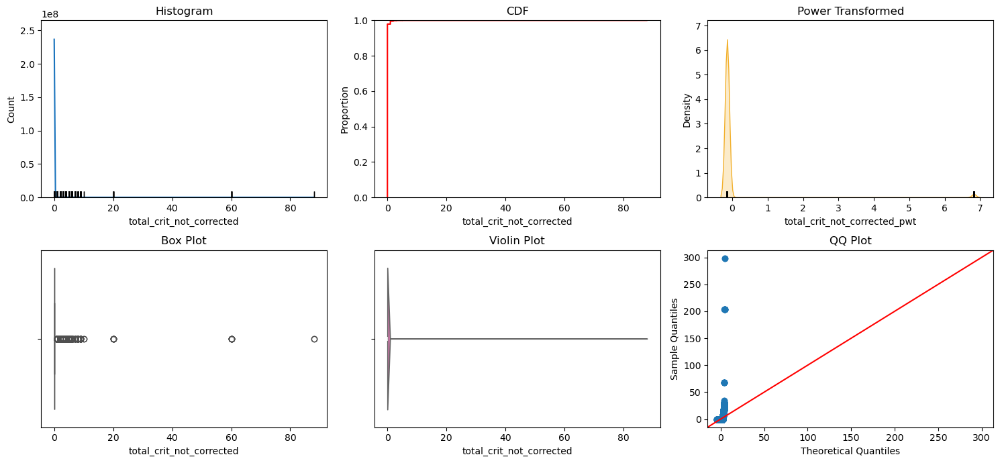

In [37]:
eda_helper_functions.num_univar_plots(inspec, "total_crit_not_corrected")

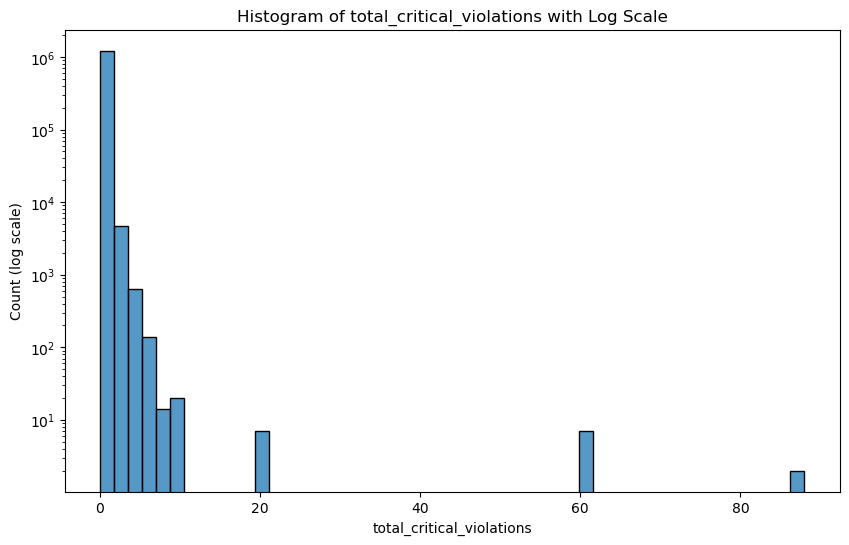

In [42]:
plt.figure(figsize=(10, 6))
sns.histplot(data=inspec, x="total_crit_not_corrected", bins=50)
plt.yscale('log')
plt.xlabel('total_critical_violations')
plt.ylabel('Count (log scale)')
plt.title('Histogram of total_critical_violations with Log Scale')
plt.show()

- we can conclude by hyp tests and the plots ,that the column `total_crit_non_corrected` is not normally distributed.

In [44]:
#Applying power transform for the data
from sklearn.preprocessing import power_transform
transformed_data = power_transform(inspec[['total_crit_not_corrected']])
transformed_series = pd.Series(transformed_data.flatten(), name='total_crit_not_corrected_transformed')
inspec['total_crit_not_corrected_transformed'] = transformed_series

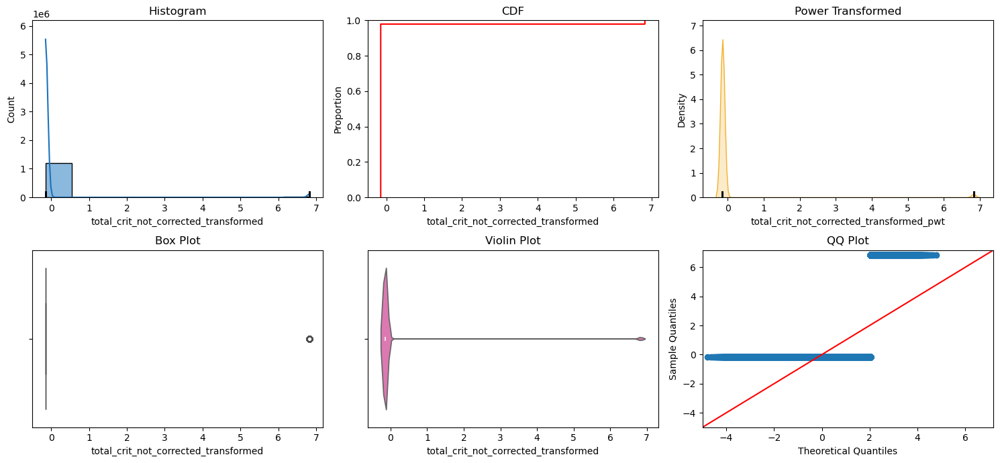

In [46]:
eda_helper_functions.num_univar_plots(inspec, "total_crit_not_corrected_transformed")

In [52]:
eda_helper_functions.num_summary(inspec, "total_crit_not_corrected_transformed")

0         -0.146502
1               NaN
2               NaN
3         -0.146502
4         -0.146502
             ...   
1310868         NaN
1310869   -0.146502
1310870   -0.146502
1310871   -0.146502
1310872   -0.146502
Name: total_crit_not_corrected_transformed, Length: 1310873, dtype: float64

Data Type      : float64
Missing Data   : 81,419 rows (6.21 %)
Available Data : 1,229,454 / 1,310,873 rows


,value
percentile,
0,-0.146502
5,-0.146502
10,-0.146502
25,-0.146502
50,-0.146502
75,-0.146502
90,-0.146502
95,-0.146502
99,6.825861


,value
mean,3.650228e-17
trimmed mean (5%),NaN
trimmed mean (10%),-1.465017e-01
median,-1.465017e-01


,value
var,1.000001e+00
std,1.000000e+00
IQR,0.000000e+00
mad,0.000000e+00
coef_variance,2.739556e+16


,value
skewness,6.679368
kurtosis,42.614023


Significance Level   : 0.05
Null Hypothesis      : The data is normally distributed
Alternate Hypothesis : The data is not normally distributed
p-value              : 2.706792027631116e-236
Test Statistic       : 0.12390639708634066
- Since p-value is less than alpha (0.05), we Reject the Null Hypothesis at 5.0% significance level
- CONCLUSION: We conclude that the data sample is not normally distributed


Significance Level   : 0.05
Null Hypothesis      : The data is normally distributed
Alternate Hypothesis : The data is not normally distributed
Critical Value       : 0.787
Test Statistic       : 463838.83191673853
- Since the Test-statistic is greater than Critical Value, we Reject the Null Hypothesis at 5.0% significance level
- CONCLUSION: We conclude that the data sample is not normally distributed


- Even after power transform `Normal distribution` is not achevied but distribution improved.

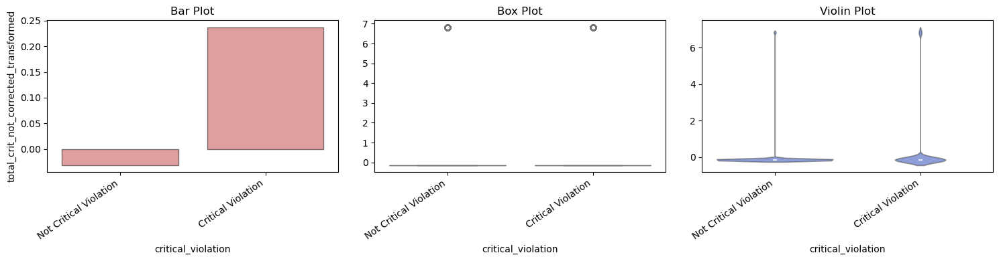

In [94]:
eda_helper_functions.num_cat_bivar_plots(
	data=inspec,
	num_var="total_crit_not_corrected_transformed",
	cat_var="critical_violation"
)

In [96]:
eda_helper_functions.num_cat_hyp_testing(inspec, "total_crit_not_corrected_transformed", "critical_violation")

- Significance Level   : 5.0%
- Null Hypothesis      : The groups have similar population mean
- Alternate Hypothesis : The groups don't have similar population mean
- Test Statistic       : 9281.466271956744
- p-value              : 0.0
- Since p-value is less than 0.05, we Reject the Null Hypothesis at 5.0% significance level
- CONCLUSION: The variables total_crit_not_corrected_transformed and critical_violation are associated to each other


- Significance Level   : 5.0%
- Null Hypothesis      : The groups have similar population median
- Alternate Hypothesis : The groups don't have similar population median
- Test Statistic       : 9211.930462174909
- p-value              : 0.0
- Since p-value is less than 0.05, we Reject the Null Hypothesis at 5.0% significance level
- CONCLUSION: The variables total_crit_not_corrected_transformed and critical_violation are associated to each other


- `total_crit_not_corrected_transformed` and `critical_violation` are associated to each other

### 6.6 Total non critical violations

In [57]:
eda_helper_functions.num_summary(inspec, "total_noncritical_violations")

0          0.0
1          NaN
2          NaN
3          0.0
4          0.0
          ... 
1310868    NaN
1310869    0.0
1310870    0.0
1310871    0.0
1310872    0.0
Name: total_noncritical_violations, Length: 1310873, dtype: float64

Data Type      : float64
Missing Data   : 80,672 rows (6.15 %)
Available Data : 1,230,201 / 1,310,873 rows


,value
percentile,
0,0.0
5,0.0
10,0.0
25,2.0
50,4.0
75,7.0
90,11.0
95,15.0
99,24.0


,value
mean,5.250862
trimmed mean (5%),NaN
trimmed mean (10%),5.102702
median,4.000000


,value
var,26.631657
std,5.160587
IQR,5.000000
mad,3.000000
coef_variance,0.982808


,value
skewness,2.471507
kurtosis,13.146916


Significance Level   : 0.05
Null Hypothesis      : The data is normally distributed
Alternate Hypothesis : The data is not normally distributed
p-value              : 1.3543689822591477e-178
Test Statistic       : 0.8094493847404969
- Since p-value is less than alpha (0.05), we Reject the Null Hypothesis at 5.0% significance level
- CONCLUSION: We conclude that the data sample is not normally distributed


Significance Level   : 0.05
Null Hypothesis      : The data is normally distributed
Alternate Hypothesis : The data is not normally distributed
Critical Value       : 0.787
Test Statistic       : 45406.74390936736
- Since the Test-statistic is greater than Critical Value, we Reject the Null Hypothesis at 5.0% significance level
- CONCLUSION: We conclude that the data sample is not normally distributed


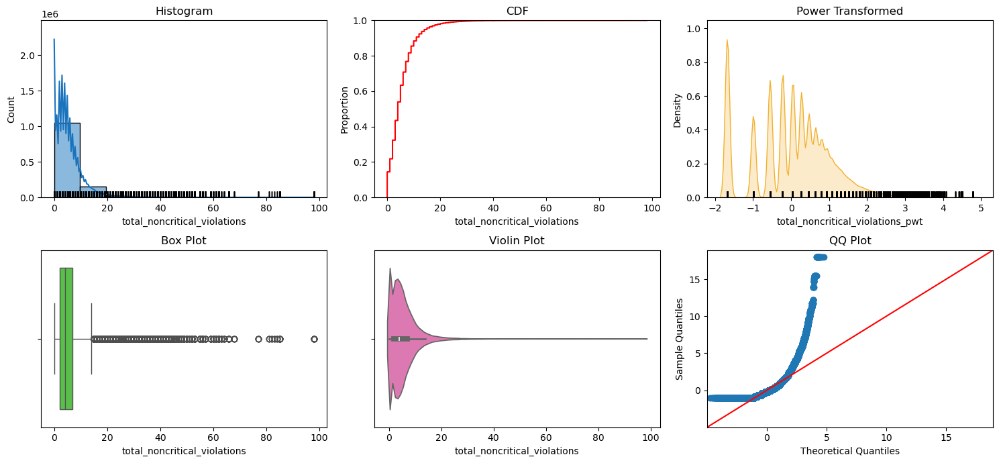

In [59]:
eda_helper_functions.num_univar_plots(inspec, "total_noncritical_violations")

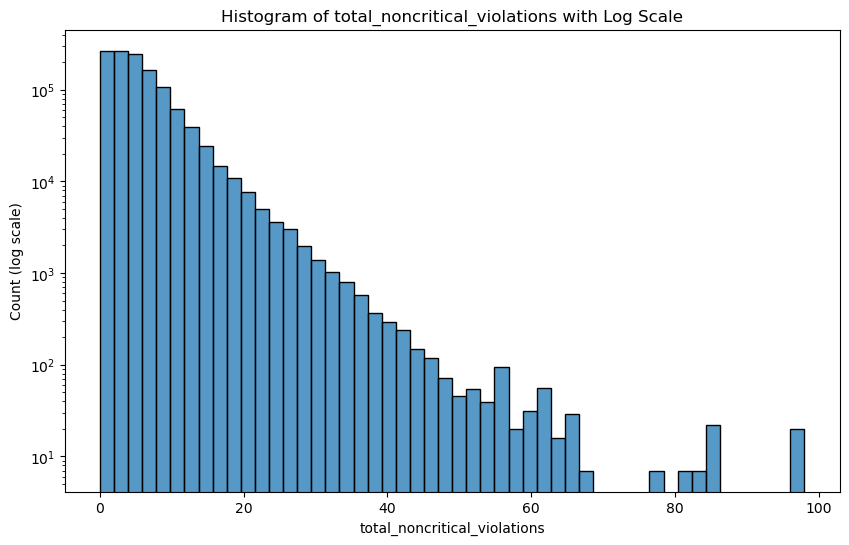

In [61]:
plt.figure(figsize=(10, 6))
sns.histplot(data=inspec, x="total_noncritical_violations", bins=50)
plt.yscale('log')
plt.xlabel('total_noncritical_violations')
plt.ylabel('Count (log scale)')
plt.title('Histogram of total_noncritical_violations with Log Scale')
plt.show()

- Looking like `total_non_critical_violations` is `Right skewed`.

In [64]:
#Applying power transform for the data
from sklearn.preprocessing import power_transform
transformed_data = power_transform(inspec[['total_noncritical_violations']])
transformed_series = pd.Series(transformed_data.flatten(), name='total_noncritical_violations_transformed')
inspec['total_noncritical_violations_transformed'] = transformed_series

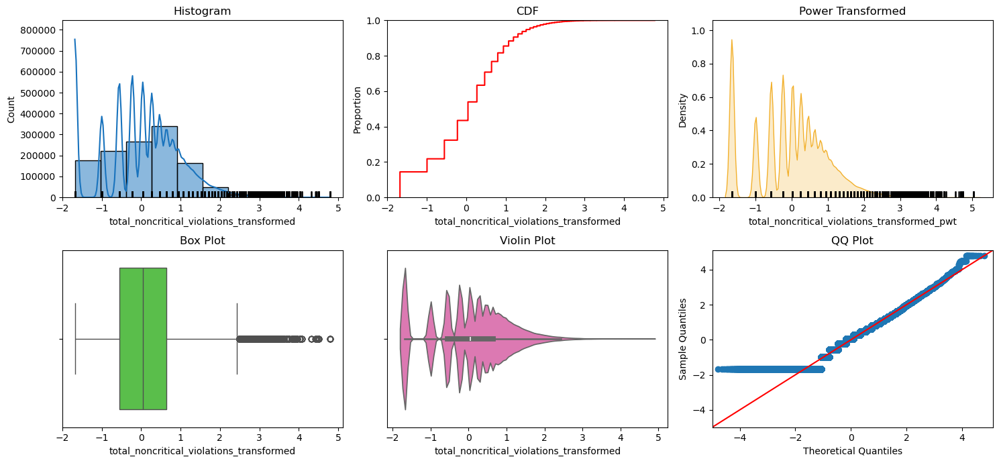

In [66]:
eda_helper_functions.num_univar_plots(inspec, "total_noncritical_violations_transformed")

In [68]:
eda_helper_functions.num_summary(inspec, "total_noncritical_violations_transformed")

0         -1.682326
1               NaN
2               NaN
3         -1.682326
4         -1.682326
             ...   
1310868         NaN
1310869   -1.682326
1310870   -1.682326
1310871   -1.682326
1310872   -1.682326
Name: total_noncritical_violations_transformed, Length: 1310873, dtype: float64

Data Type      : float64
Missing Data   : 80,672 rows (6.15 %)
Available Data : 1,230,201 / 1,310,873 rows


,value
percentile,
0,-1.682326
5,-1.682326
10,-1.682326
25,-0.556406
50,0.042405
75,0.640755
90,1.196384
95,1.614256
99,2.303920


,value
mean,5.750182e-16
trimmed mean (5%),NaN
trimmed mean (10%),1.081246e-01
median,4.240488e-02


,value
var,1.000001e+00
std,1.000000e+00
IQR,1.197161e+00
mad,5.988110e-01
coef_variance,1.739076e+15


,value
skewness,-0.019708
kurtosis,-0.324287


Significance Level   : 0.05
Null Hypothesis      : The data is normally distributed
Alternate Hypothesis : The data is not normally distributed
p-value              : 8.816545875831519e-125
Test Statistic       : 0.9641009273032607
- Since p-value is less than alpha (0.05), we Reject the Null Hypothesis at 5.0% significance level
- CONCLUSION: We conclude that the data sample is not normally distributed


Significance Level   : 0.05
Null Hypothesis      : The data is normally distributed
Alternate Hypothesis : The data is not normally distributed
Critical Value       : 0.787
Test Statistic       : 12275.040228999918
- Since the Test-statistic is greater than Critical Value, we Reject the Null Hypothesis at 5.0% significance level
- CONCLUSION: We conclude that the data sample is not normally distributed


- `Distribution` is improved and `outliers are reduced`.

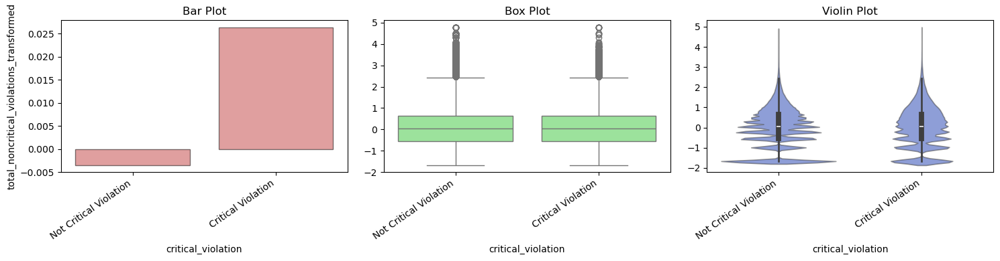

In [101]:
eda_helper_functions.num_cat_bivar_plots(
	data=inspec,
	num_var="total_noncritical_violations_transformed",
	cat_var="critical_violation"
)

In [103]:
eda_helper_functions.num_cat_hyp_testing(inspec, "total_noncritical_violations_transformed", "critical_violation")

- Significance Level   : 5.0%
- Null Hypothesis      : The groups have similar population mean
- Alternate Hypothesis : The groups don't have similar population mean
- Test Statistic       : 114.0453263331394
- p-value              : 1.2770656526583346e-26
- Since p-value is less than 0.05, we Reject the Null Hypothesis at 5.0% significance level
- CONCLUSION: The variables total_noncritical_violations_transformed and critical_violation are associated to each other


- Significance Level   : 5.0%
- Null Hypothesis      : The groups have similar population median
- Alternate Hypothesis : The groups don't have similar population median
- Test Statistic       : 16.439436293672674
- p-value              : 5.022930047160323e-05
- Since p-value is less than 0.05, we Reject the Null Hypothesis at 5.0% significance level
- CONCLUSION: The variables total_noncritical_violations_transformed and critical_violation are associated to each other


- `total_noncritical_violations_transformed` and `critical_violation` are associated to each other

### 6.7 Local health department 

In [108]:
eda_helper_functions.cat_summary(inspec, "local_health_department")

0                Rensselaer County
1          Hornell District Office
2               Westchester County
3                  Dutchess County
4                   Genesee County
                    ...           
1310868         Westchester County
1310869            Onondaga County
1310870             Niagara County
1310871             Genesee County
1310872              Orange County
Name: local_health_department, Length: 1310873, dtype: object

Data Type      : object
Cardinality    : 45 categories
Missing Data   : 39 rows (0.00 %)
Available Data : 1,310,834 / 1,310,873 rows


,
count,1310834
unique,45
top,Westchester County
freq,175883


,count,percentage
category,,
Westchester County,175883,0.134176
Nassau County,160850,0.122708
Monroe County,117206,0.089413
Onondaga County,79448,0.060609
Glens Falls District Office,53669,0.040943
Dutchess County,52625,0.040146
Rockland County,47524,0.036255
Orange County,46475,0.035455
Broome County,44638,0.034053


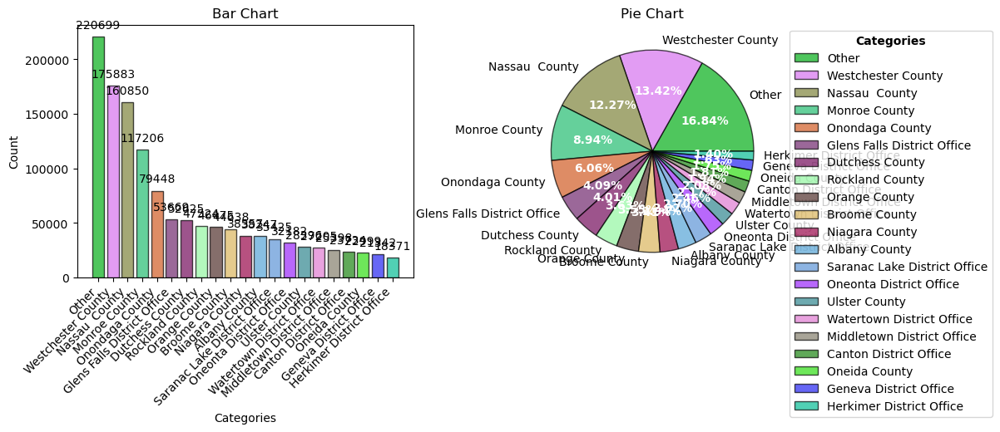

In [112]:
eda_helper_functions.cat_univar_plots(inspec, "local_health_department", show_wordcloud=False, k=20)


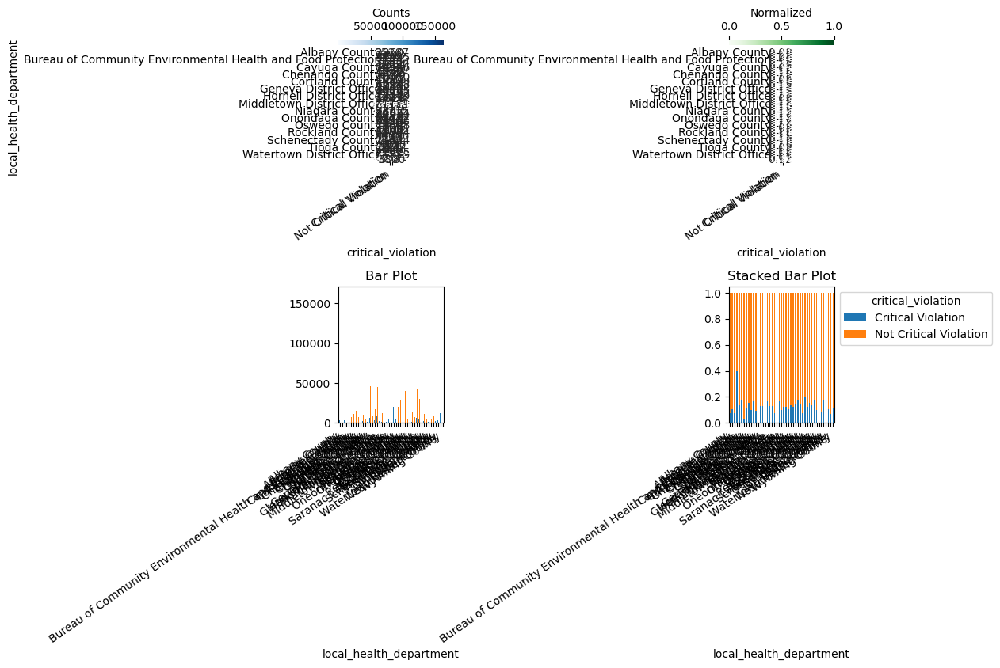

In [114]:
eda_helper_functions.cat_bivar_plots(inspec,"local_health_department","critical_violation")

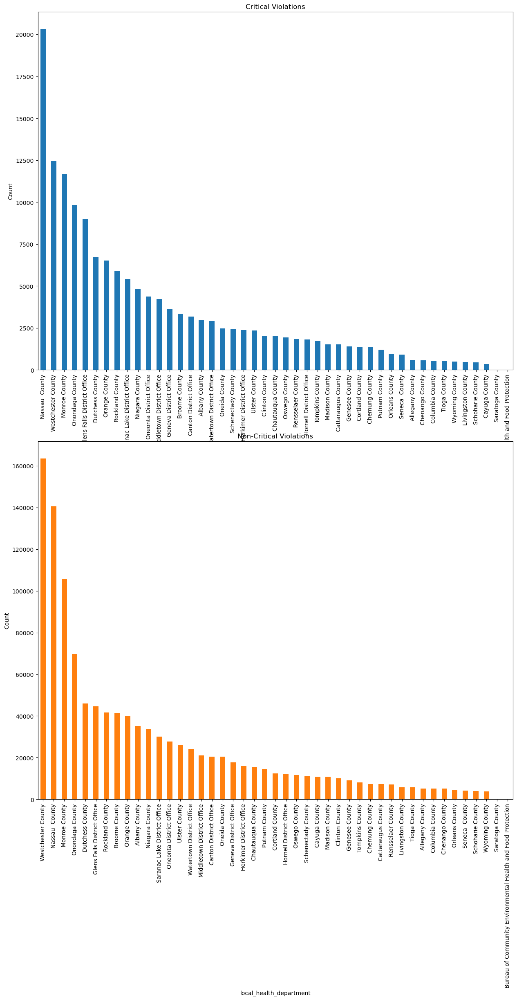

In [124]:
critical = inspec[inspec['critical_violation'] == 'Critical Violation']
non_critical = inspec[inspec['critical_violation'] == 'Not Critical Violation']

critical_counts = critical['local_health_department'].value_counts()
non_critical_counts = non_critical['local_health_department'].value_counts()

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 25))

# Bar plots
critical_counts.plot(kind='bar', ax=ax1, color='#1f77b4')
ax1.set_title('Critical Violations')
ax1.set_xlabel('Local_health_department')
ax1.set_ylabel('Count')
ax1.tick_params(axis='x', rotation=90)

non_critical_counts.plot(kind='bar', ax=ax2, color='#ff7f0e')
ax2.set_title('Non-Critical Violations')
ax2.set_xlabel('local_health_department')
ax2.set_ylabel('Count')
ax2.tick_params(axis='x', rotation=90)


### 6.8 county 

In [131]:
eda_helper_functions.cat_summary(inspec, "county")

0           RENSSELAER
1              STEUBEN
2          WESTCHESTER
3             DUTCHESS
4              GENESEE
              ...     
1310868    WESTCHESTER
1310869       ONONDAGA
1310870        NIAGARA
1310871        GENESEE
1310872         ORANGE
Name: county, Length: 1310873, dtype: object

Data Type      : object
Cardinality    : 55 categories
Missing Data   : 39 rows (0.00 %)
Available Data : 1,310,834 / 1,310,873 rows


,
count,1310834
unique,55
top,WESTCHESTER
freq,175883


,count,percentage
category,,
WESTCHESTER,175883,0.134176
NASSAU,160850,0.122708
MONROE,117206,0.089413
ONONDAGA,79448,0.060609
DUTCHESS,52625,0.040146
ROCKLAND,48199,0.036770
ORANGE,46475,0.035455
BROOME,44638,0.034053
NIAGARA,38557,0.029414


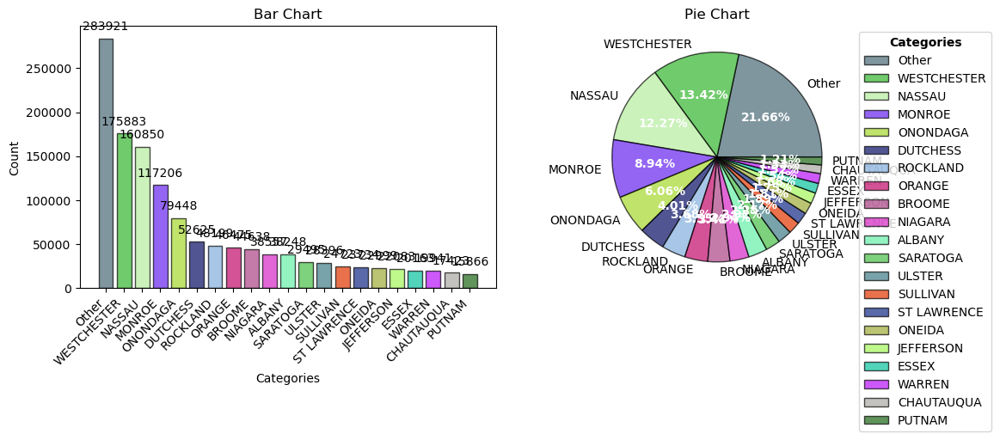

In [127]:
eda_helper_functions.cat_univar_plots(inspec, "county", show_wordcloud=False, k=20)


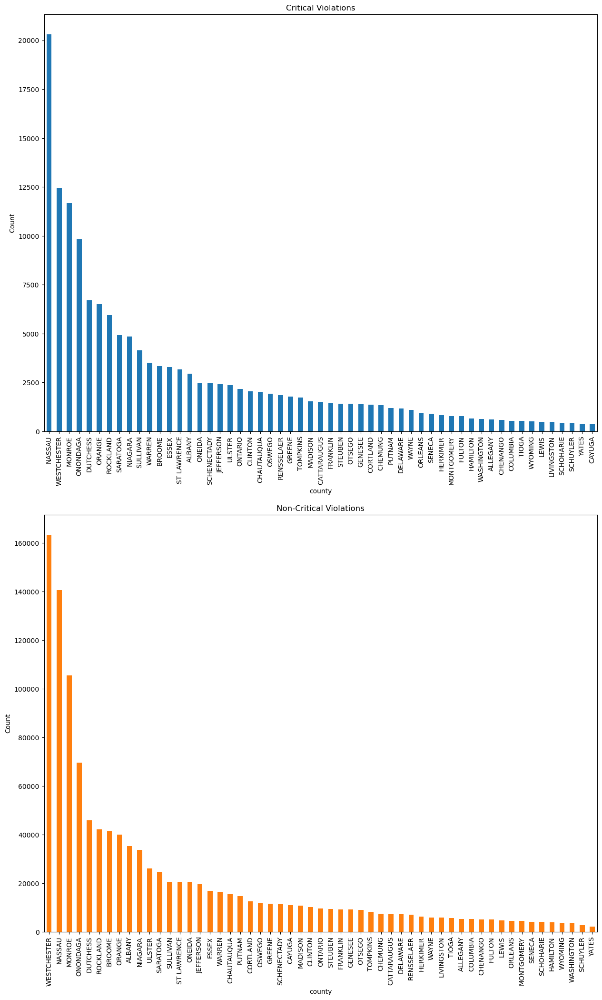

In [133]:
critical = inspec[inspec['critical_violation'] == 'Critical Violation']
non_critical = inspec[inspec['critical_violation'] == 'Not Critical Violation']

critical_counts = critical['county'].value_counts()
non_critical_counts = non_critical['county'].value_counts()

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 25))

# Bar plots
critical_counts.plot(kind='bar', ax=ax1, color='#1f77b4')
ax1.set_title('Critical Violations')
ax1.set_xlabel('county')
ax1.set_ylabel('Count')
ax1.tick_params(axis='x', rotation=90)

non_critical_counts.plot(kind='bar', ax=ax2, color='#ff7f0e')
ax2.set_title('Non-Critical Violations')
ax2.set_xlabel('county')
ax2.set_ylabel('Count')
ax2.tick_params(axis='x', rotation=90)


In [135]:
eda_helper_functions.hyp_cat_cat(inspec,"county","critical_violation")


- Cramers V            : 0.10187422385656457
- Significance Level   : 5.0%
- Null Hypothesis      : The samples are uncorrelated
- Alternate Hypothesis : The samples are correlated
- Test Statistic       : 13658.293520127845
- p-value              : 0.0
- Since p-value is less than 0.05, we Reject the Null Hypothesis at 5.0% significance level
- CONCLUSION: The variables county and critical_violation are correlated


In [137]:
contingency_table = pd.crosstab(inspec['county'], inspec['critical_violation'])
print(contingency_table)

critical_violation  Critical Violation  Not Critical Violation
county                                                        
ALBANY                            2961                   35287
ALLEGANY                           600                    5243
BROOME                            3343                   41295
CATTARAUGUS                       1521                    7264
CAYUGA                             358                   10956
CHAUTAUQUA                        2026                   15397
CHEMUNG                           1347                    7383
CHENANGO                           584                    5150
CLINTON                           2045                   10140
COLUMBIA                           531                    5237
CORTLAND                          1368                   12479
DELAWARE                          1174                    7194
DUTCHESS                          6707                   45918
ESSEX                             3302                 

- We can divide the `county` into categories based on the `critical violation rate`
- `county` and `critical_violation` are associated.

### 6.9 facility city

In [159]:
eda_helper_functions.cat_summary(inspec, "facility_city")

0          EAST GREENBUSH
1                    BATH
2             MOUNT KISCO
3                  BEACON
4                   Corfu
                ...      
1310868           YONKERS
1310869     BALDWINSVILLE
1310870          LOCKPORT
1310871           Batavia
1310872           CHESTER
Name: facility_city, Length: 1310873, dtype: object

Data Type      : object
Cardinality    : 1919 categories
Missing Data   : 172 rows (0.01 %)
Available Data : 1,310,701 / 1,310,873 rows


,
count,1310701
unique,1919
top,ROCHESTER
freq,82610


,count,percentage
category,,
ROCHESTER,82610,6.302734e-02
Syracuse,33639,2.566489e-02
YONKERS,23231,1.772410e-02
ALBANY,21445,1.636147e-02
WHITE PLAINS,18659,1.423589e-02
BINGHAMTON,18580,1.417562e-02
POUGHKEEPSIE,16915,1.290531e-02
NEW ROCHELLE,13998,1.067978e-02
NIAGARA FALLS,12923,9.859609e-03


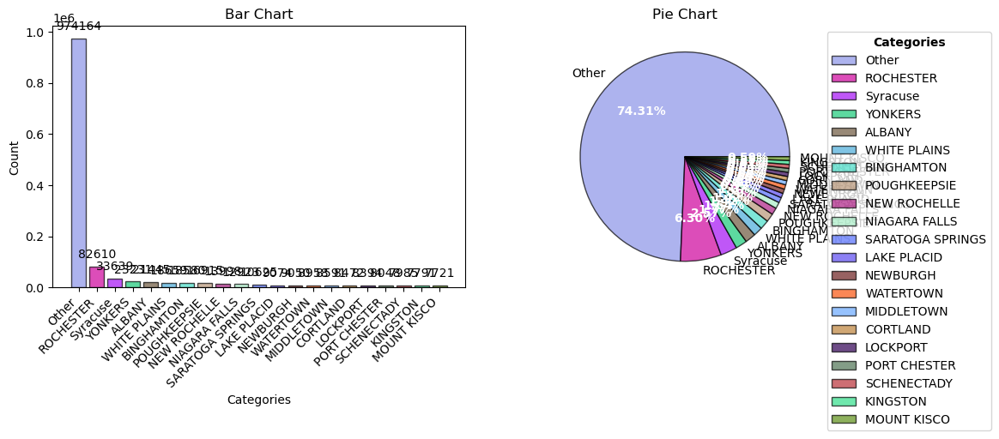

In [161]:
eda_helper_functions.cat_univar_plots(inspec, "facility_city", show_wordcloud=False, k=20)


In [163]:
eda_helper_functions.hyp_cat_cat(inspec,"facility_city","critical_violation")


- Cramers V            : 0.1186646939799009
- Significance Level   : 5.0%
- Null Hypothesis      : The samples are uncorrelated
- Alternate Hypothesis : The samples are correlated
- Test Statistic       : 20374.373952567625
- p-value              : 0.0
- Since p-value is less than 0.05, we Reject the Null Hypothesis at 5.0% significance level
- CONCLUSION: The variables facility_city and critical_violation are correlated


In [165]:
insp.county.nunique()

55

In [167]:
insp.facility_city.nunique()

1919

In [269]:
insp.local_health_department.nunique()

45

- Even though `city` and `critical_violation` are corelated, it has `too many categories` which becomes difficult while training the model.so,we will go with `local_health_department`

### 6.10 Facility municipality

In [173]:
eda_helper_functions.cat_summary(inspec, "facility_municipality")

0          E. GREENBUSH
1                  BATH
2             MT. KISCO
3              FISHKILL
4              PEMBROKE
               ...     
1310868         YONKERS
1310869       VAN BUREN
1310870        LOCKPORT
1310871         BATAVIA
1310872         CHESTER
Name: facility_municipality, Length: 1310873, dtype: object

Data Type      : object
Cardinality    : 914 categories
Missing Data   : 39 rows (0.00 %)
Available Data : 1,310,834 / 1,310,873 rows


,
count,1310834
unique,914
top,HEMPSTEAD
freq,76854


,count,percentage
category,,
HEMPSTEAD,76854,5.862985e-02
ROCHESTER,42360,3.231530e-02
N. HEMPSTEAD,35105,2.678066e-02
OYSTER BAY,33497,2.555396e-02
SYRACUSE,28710,2.190209e-02
YONKERS,23543,1.796032e-02
POUGHKEEPSIE,17164,1.309395e-02
WHITE PLAINS,16084,1.227005e-02
GREENBURGH,15816,1.206560e-02


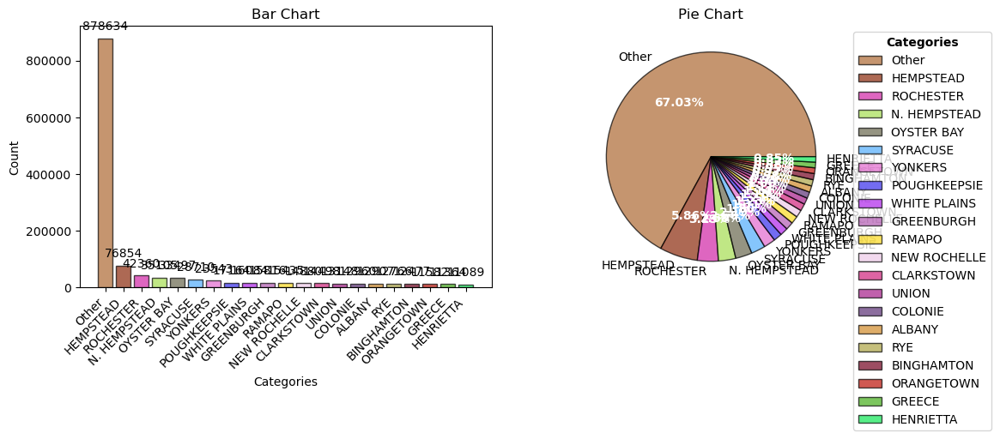

In [175]:
eda_helper_functions.cat_univar_plots(inspec, "facility_municipality", show_wordcloud=False, k=20)


In [179]:
eda_helper_functions.hyp_cat_cat(inspec,"facility_municipality","critical_violation")


- Cramers V            : 0.1130393991750309
- Significance Level   : 5.0%
- Null Hypothesis      : The samples are uncorrelated
- Alternate Hypothesis : The samples are correlated
- Test Statistic       : 17662.70124526297
- p-value              : 0.0
- Since p-value is less than 0.05, we Reject the Null Hypothesis at 5.0% significance level
- CONCLUSION: The variables facility_municipality and critical_violation are correlated


In [181]:
insp.facility_municipality.nunique()

914

- We will go with `county`.

### 6.11 Permit expiration date

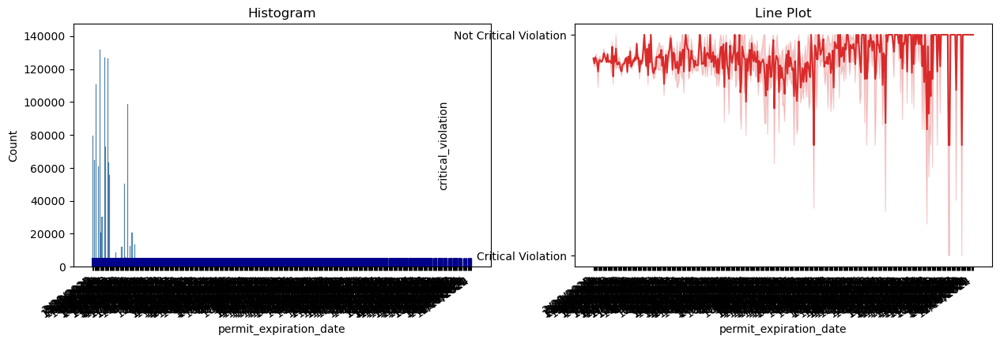

In [188]:
eda_helper_functions.dt_univar_plots(
	data=inspec,
	var="permit_expiration_date",
	target="critical_violation"
)

In [23]:
eda_helper_functions.hyp_cat_cat(inspec,"permit_expiration_date","critical_violation")


- Cramers V            : 0.04256537443760806
- Significance Level   : 5.0%
- Null Hypothesis      : The samples are uncorrelated
- Alternate Hypothesis : The samples are correlated
- Test Statistic       : 2749.6580491805025
- p-value              : 0.0
- Since p-value is less than 0.05, we Reject the Null Hypothesis at 5.0% significance level
- CONCLUSION: The variables permit_expiration_date and critical_violation are correlated


- we can create a new feature using `Date_of_inspection` and `permit_expiry`.

In [57]:
#Imputing null values
inspec.permit_expiration_date.isna().sum()

15672

In [99]:
inspec.permit_expiration_date.dtype

dtype('<M8[ns]')

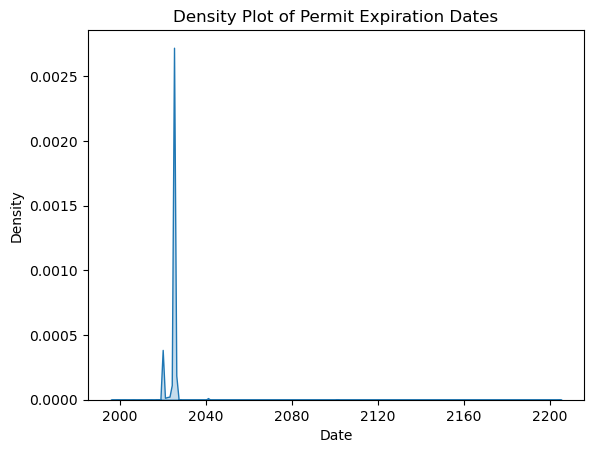

In [105]:
sns.kdeplot(inspec['permit_expiration_date'], shade=True)
plt.title('Density Plot of Permit Expiration Dates')
plt.xlabel('Date')
plt.show()

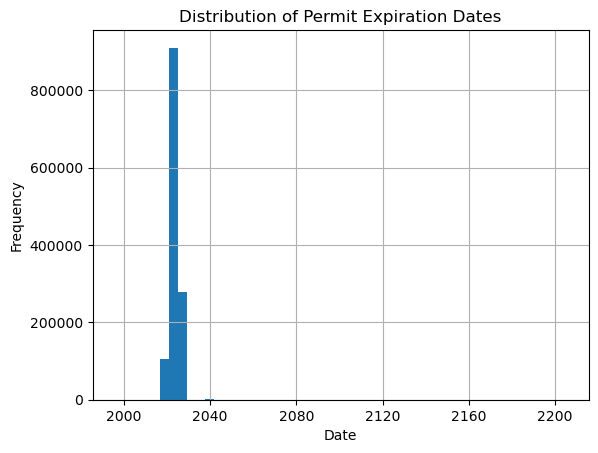

In [109]:
#hist plot
inspec['permit_expiration_date'].hist(bins=50)
plt.title('Distribution of Permit Expiration Dates')
plt.xlabel('Date')
plt.ylabel('Frequency')
plt.show()

- Using `KNN IMPUTER` to fill the null values of column`Permit expiration date`

In [117]:

from sklearn.impute import KNNImputer
inspec['permit_expiration_date'] = pd.to_datetime(inspec['permit_expiration_date'], errors='coerce')
inspec['permit_expiration_date_numeric'] = inspec['permit_expiration_date'].astype('int64') // 10**9

# KNN Imputer
imputer = KNNImputer(n_neighbors=5)
inspec['permit_expiration_date_numeric'] = imputer.fit_transform(inspec[['permit_expiration_date_numeric']])

# Converting back to datetime
inspec['permit_expiration_date'] = pd.to_datetime(inspec['permit_expiration_date_numeric'], unit='ms')
inspec.drop(columns=['permit_expiration_date_numeric'], inplace=True)

In [119]:
inspec.permit_expiration_date

0         1970-01-21 03:31:40.800
1         1970-01-21 02:28:19.200
2         1970-01-20 23:11:02.400
3         1970-01-20 14:45:36.000
4         1970-01-20 23:54:14.400
                    ...          
1310768   1970-01-21 01:22:04.800
1310769   1970-01-21 10:55:12.000
1310770   1970-01-21 02:51:21.600
1310771   1970-01-21 01:22:04.800
1310772   1970-01-20 23:54:14.400
Name: permit_expiration_date, Length: 1310773, dtype: datetime64[ns]

In [121]:
inspec.permit_expiration_date.isna().sum()

0

### 6.12 food_service_type

In [25]:
eda_helper_functions.cat_summary(inspec, "food_service_type")

0          Food Service Establishment
1                   SOFA Food Service
2          Food Service Establishment
3          Food Service Establishment
4          Food Service Establishment
                      ...            
1310868    Food Service Establishment
1310869    Institutional Food Service
1310870    Food Service Establishment
1310871    Institutional Food Service
1310872    Food Service Establishment
Name: food_service_type, Length: 1310873, dtype: object

Data Type      : object
Cardinality    : 4 categories
Missing Data   : 39 rows (0.00 %)
Available Data : 1,310,834 / 1,310,873 rows


,
count,1310834
unique,4
top,Food Service Establishment
freq,1131871


,count,percentage
category,,
Food Service Establishment,1131871,0.863474
Institutional Food Service,154703,0.118019
SED Summer Feeding Prog.,14210,0.010840
SOFA Food Service,10050,0.007667


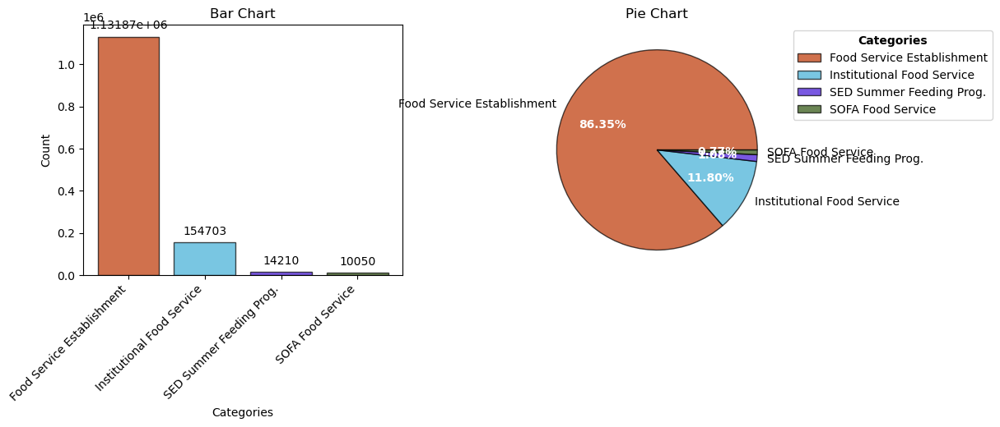

In [29]:
eda_helper_functions.cat_univar_plots(inspec, "food_service_type", show_wordcloud=False)


In [31]:
eda_helper_functions.hyp_cat_cat(inspec,"food_service_type","critical_violation")


- Cramers V            : 0.030573673498752715
- Significance Level   : 5.0%
- Null Hypothesis      : The samples are uncorrelated
- Alternate Hypothesis : The samples are correlated
- Test Statistic       : 1228.300508313662
- p-value              : 5.307366516271311e-266
- Since p-value is less than 0.05, we Reject the Null Hypothesis at 5.0% significance level
- CONCLUSION: The variables food_service_type and critical_violation are correlated


- so,`food_service_type` and `critical_violation` are also associated

In [43]:
(inspec.
 food_service_type.
 isna().
 sum())

39

- Using `simple IMPUTER`

In [225]:
from sklearn.impute import SimpleImputer
imputer = SimpleImputer(strategy='constant', fill_value='Unknown')
inspec['food_service_type'] = imputer.fit_transform(inspec['food_service_type'].values.reshape(-1, 1)).squeeze()

In [228]:
inspec.food_service_type.isna().sum()


0

## 6.11 Inspection type 

In [35]:
eda_helper_functions.cat_summary(inspec,"inspection_type")

0             Inspection
1             Inspection
2             Inspection
3             Inspection
4          Re-Inspection
               ...      
1310868       Inspection
1310869       Inspection
1310870       Inspection
1310871       Inspection
1310872       Inspection
Name: inspection_type, Length: 1310873, dtype: object

Data Type      : object
Cardinality    : 2 categories
Missing Data   : 39 rows (0.00 %)
Available Data : 1,310,834 / 1,310,873 rows


,
count,1310834
unique,2
top,Inspection
freq,1188410


,count,percentage
category,,
Inspection,1188410,0.906606
Re-Inspection,122424,0.093394


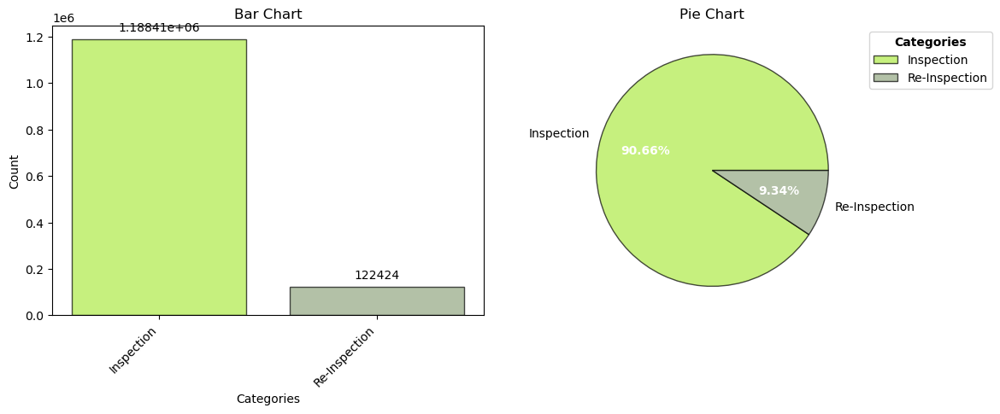

In [37]:
eda_helper_functions.cat_univar_plots(inspec, "inspection_type", show_wordcloud=False)


In [39]:
eda_helper_functions.hyp_cat_cat(inspec,"inspection_type","critical_violation")


- Cramers V            : 0.03105808802701061
- Significance Level   : 5.0%
- Null Hypothesis      : The samples are uncorrelated
- Alternate Hypothesis : The samples are correlated
- Test Statistic       : 1265.435846367642
- p-value              : 3.669229132168669e-277
- Since p-value is less than 0.05, we Reject the Null Hypothesis at 5.0% significance level
- CONCLUSION: The variables inspection_type and critical_violation are correlated


In [230]:
inspec.inspection_type.isna().sum()

0

In [238]:
inspec.isna().sum()


facility                                0
address                                 2
date_of_inspection                      0
violation_item                          0
violation_description              241132
critical_violation                      0
total_critical_violations               0
total_crit_not_corrected                0
total_noncritical_violations            0
local_health_department                 0
county                                  0
facility_code                           0
facility_address                        6
facility_city                         133
facility_postal_zipcode               133
nysdoh_gazetteer                        0
facility_municipality                   0
operation_name                          0
permit_expiration_date                  0
food_service_type                       0
food_service_description                0
permitted_dba                     1176922
permitted_corp_name                305427
perm_operator_last_name           

- `NULL VALUES` OF THE COLUMNS REQUIRED FOR `FEATURE ENG` ARE `IMPUTED`

- we will only export columns to database which are `useful for feature engg.`

In [284]:
inspec_selected = inspec[[
    "facility",
    "date_of_inspection_transformed",
    "violation_item",
    "critical_violation",
    "total_critical_violations",
    "total_crit_not_corrected",
    "total_noncritical_violations",
    "local_health_department",
    "permit_expiration_date",
    "food_service_type",
    "inspection_type"
]]

inspec_selected.to_sql(
    'f_eng_col', 
    engine,
    if_exists='replace',
    index=False
)

734